# Introduction  
  

  
❗**WARNING:**❗  
❗**Total runtime of this notebook is > 4 hours**❗
  
  
  
**Introduction**  
This Notebook is the image classification part of the Master II Big Data and AI project, consisting of three tasks: image-classification, text-classification, time series prediction.  
  
    

**Target**  

The model must predict one of the following classes of an image:

* ground (« chao ») : ground without vegetation,
* corn (« milho ») : corn,
* weeds (« ervas ») : different vegetation, weeds,
* corn/weeds (« milho/ervas ») : corn and weeds.

**Data**
  
  Used is the following dataset: https://www.kaggle.com/datasets/rodrigonuneswessner/labeledcorndataset

**Goal**
  
  The goal is to identify zones that need watering.  
    
    
**Process**
  
We will create multiple models and train and save them. We will create a base model and experiment with different dropout rates, batch normalization and different optimizers. Then we will use existing models, the original model and a "selfmade" kind of model. Finally we will compare the results and analyse using the best model and LIME.


**Model Data**
* Checkpoints: https://drive.google.com/drive/folders/1KoLNLNQX_hvUHPPUC4-pIPmSJn8st8xC?usp=sharing

* Models, results and history objects: https://drive.google.com/drive/folders/1ZJDrTF0gs7lxXWtvI9TSUWZVKurrDPVr?usp=sharing

## Libraries and Data import

We are downloading the data from the dataset to google colab.

In [1]:
import numpy as np
import pandas as pd
import tensorflow
import seaborn as sns
import os
import keras
import sklearn
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline

from pylab import imread, subplot, imshow, show
from tqdm.notebook import trange, tqdm

from skimage import io
import skimage.transform

### Deep Learning models ###
import tensorflow
import keras
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.callbacks import TensorBoard, ModelCheckpoint
from keras.optimizers import Adam, Adagrad, RMSprop
from keras import layers
from keras.models import Model
from keras.applications import Xception, VGG16, VGG19
from multiprocessing import Pool
from keras.models import load_model
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, BatchNormalization,  SeparableConv2D, ZeroPadding2D, UpSampling2D, Input, GlobalAveragePooling2D, AveragePooling2D
from keras.losses import categorical_crossentropy
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from keras.applications.vgg16 import preprocess_input

import os
import random
import shutil

RANDOM_STATE = 26
keras.utils.set_random_seed(RANDOM_STATE)

import warnings
warnings.simplefilter(action='ignore')

!pip install lime --quiet

import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries


import pickle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


### Data downloading

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Install Kaggle library for API command to work
!pip install -q kaggle

In [4]:
# Get Kaggle API Key
!mkdir -p ~/.kaggle
!cp '/content/drive/MyDrive/BIHAR_FINAL_PROJECT/kaggle.json' ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

In [5]:
# Download dataset from Kaggle
!kaggle datasets download -d rodrigonuneswessner/labeledcorndataset

100% 4.13G/4.13G [03:28<00:00, 23.7MB/s]
100% 4.13G/4.13G [03:28<00:00, 21.2MB/s]


In [6]:
# Unzip the downloaded dataset to runtime files
!echo "N" | unzip -q labeledcorndataset.zip

### Data selection

The splits between test, train and validation are already done.   
Here, I create a new directory containing 25% of the original train data, as more data would take too long to process.  
  
I keep the same amount of train and validation data, as this results in a more trustworthy score.

In [7]:
test_path_chao = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Chao'
train_path_chao = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Chao'
val_path_chao = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo/Chao'

test_path_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Ervas'
train_path_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Ervas'
val_path_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo/Ervas'

test_path_milho = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Milho'
train_path_milho = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Milho'
val_path_milho = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo/Milho'

test_path_milho_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste/Milho_ervas'
train_path_milho_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino/Milho_ervas'
val_path_milho_ervas = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo/Milho_ervas'


In [8]:
train_dir = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Treino'
validation_dir = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo'
test_dir = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste'


In [9]:
# new folder for train images
new_train_dir = '/content/TRAIN'
class_directories = os.listdir(train_dir)

# Create the new train directory if it doesn't exist
os.makedirs(new_train_dir, exist_ok=True)

# Proportion of data to keep
proportion_to_keep = 0.25

random.seed(RANDOM_STATE)

# Iterate over each class directory
for class_dir in class_directories:
    # Create the corresponding directory in the new train directory
    new_class_dir = os.path.join(new_train_dir, class_dir)
    os.makedirs(new_class_dir, exist_ok=True)

    # List all files in the class directory
    class_files = os.listdir(os.path.join(train_dir, class_dir))

    # Calculate the number of files to keep
    num_files_to_keep = int(len(class_files) * proportion_to_keep)

    # Randomly select files to keep
    files_to_keep = random.sample(class_files, num_files_to_keep)

    # Copy the selected files to the new class directory
    for file_name in files_to_keep:
        src = os.path.join(train_dir, class_dir, file_name)
        dst = os.path.join(new_class_dir, file_name)
        shutil.copy(src, dst)


# Data Exploration

In this part we look at some pictures and verify the classes distributions.

## Data examples

In [ ]:
def afficher_images(train_path_folder, title, num_images_to_display):
    # Liste des fichiers dans le dossier
    image_files = os.listdir(train_path_folder)

    plt.figure(figsize=(15, 5))
    for i in range(num_images_to_display):
        # Chemin complet de l'image
        img_path = os.path.join(train_path_folder, image_files[i])

        # Charger l'image
        image = img.imread(img_path)

        # Afficher l'image
        plt.subplot(2, 5, i+1)  # 2 rows, 5 columns
        plt.imshow(image)
        plt.suptitle(title, fontsize=16)
        plt.axis('off')

    plt.show()

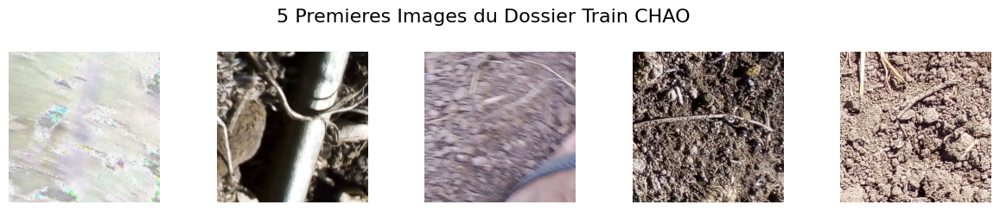

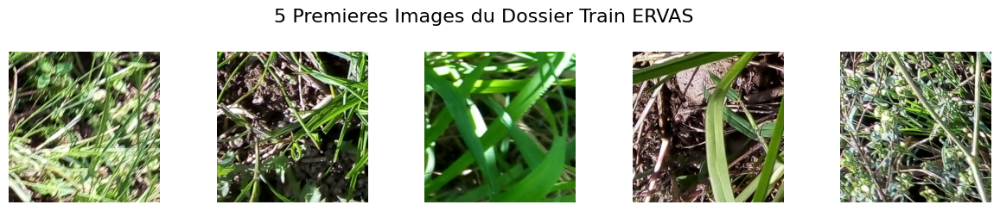

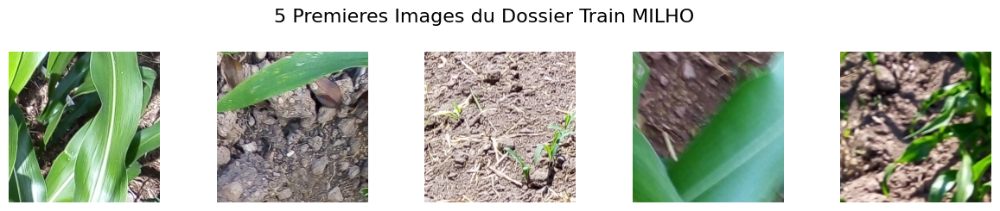

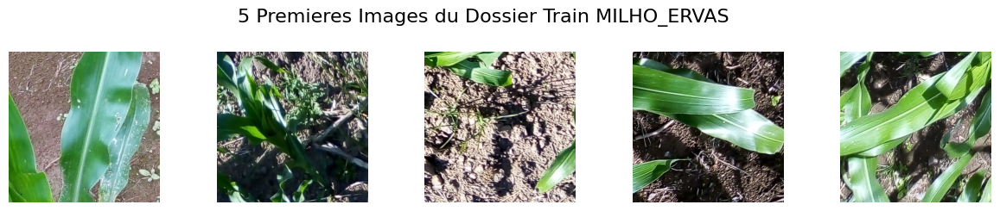

In [ ]:
afficher_images(train_path_chao, "5 Premieres Images du Dossier Train CHAO", 5)
afficher_images(train_path_ervas, "5 Premieres Images du Dossier Train ERVAS", 5)
afficher_images(train_path_milho, "5 Premieres Images du Dossier Train MILHO", 5)
afficher_images(train_path_milho_ervas, "5 Premieres Images du Dossier Train MILHO_ERVAS", 5)

## Class statistics

In [ ]:
def calculate_class_stats(directory):
    class_counts = {}
    total_images = 0

    # Iterate over the subdirectories in the given directory
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)

        # Count the number of files (images) in the subdirectory
        num_images = len(os.listdir(class_path))

        # Store the class count in the dictionary
        class_counts[class_name] = num_images
        total_images += num_images

    # Print the class counts
    for class_name, count in class_counts.items():
        print(f"Class '{class_name}': {count} images")

    # Calculate the proportion of images for each class
    class_proportions = {class_name: count / total_images for class_name, count in class_counts.items()}

    # Print the class proportions
    for class_name, proportion in class_proportions.items():
        print(f"Proportion of class '{class_name}': {proportion:.2%}")

    return class_counts, class_proportions, total_images



In [ ]:
# Calculate class statistics for the train directory
print("Train Directory:")
train_class_counts, train_class_proportions, total_train_images = calculate_class_stats(train_dir)

# Calculate class statistics for the test directory
print("\nTest Directory:")
test_class_counts, test_class_proportions, total_test_images = calculate_class_stats(test_dir)

# Calculate class statistics for the validation directory
print("\nValidation Directory:")
val_class_counts, val_class_proportions, total_val_images = calculate_class_stats(validation_dir)

# Check class balance between train, test, and validation directories
print("\nClass balance between train, test, and validation directories:")
for class_name in train_class_counts.keys():
    train_proportion = train_class_counts[class_name] / total_train_images
    test_proportion = test_class_counts[class_name] / total_test_images
    val_proportion = val_class_counts[class_name] / total_val_images
    print(f"Class '{class_name}': Train - {train_proportion:.2%}, Test - {test_proportion:.2%}, Validation - {val_proportion:.2%}")

Train Directory:
Class 'Ervas': 1503 images
Class 'Milho_ervas': 1510 images
Class 'Chao': 1533 images
Class 'Milho': 1563 images
Proportion of class 'Ervas': 24.60%
Proportion of class 'Milho_ervas': 24.72%
Proportion of class 'Chao': 25.09%
Proportion of class 'Milho': 25.59%

Test Directory:
Class 'Ervas': 100 images
Class 'Milho_ervas': 100 images
Class 'Chao': 100 images
Class 'Milho': 100 images
Proportion of class 'Ervas': 25.00%
Proportion of class 'Milho_ervas': 25.00%
Proportion of class 'Chao': 25.00%
Proportion of class 'Milho': 25.00%

Validation Directory:
Class 'Ervas': 668 images
Class 'Milho_ervas': 670 images
Class 'Chao': 646 images
Class 'Milho': 695 images
Proportion of class 'Ervas': 24.93%
Proportion of class 'Milho_ervas': 25.01%
Proportion of class 'Chao': 24.11%
Proportion of class 'Milho': 25.94%

Class balance between train, test, and validation directories:
Class 'Ervas': Train - 24.60%, Test - 25.00%, Validation - 24.93%
Class 'Milho_ervas': Train - 24.72%

We can see here that we have balanced classes. This is important as this information indicates that we do not need to specify class weights to counterbalance a possible inbalance here.

## Image size verfication

In order to specify a size we want the images to resize to, we check the original size of some pictures, then we set a size of our choice, not too small, not too big.

In [ ]:
def check_image_size_for_first_n(image_directory, label, n=10):
    print(f'\n\n Image sizes for {label}')

    # Create an ImageCollection for the images in the directory
    image_collection = skimage.io.ImageCollection(image_directory + '/*.jpg', load_func=skimage.io.imread)

    # Iterate over the first n images
    for i, image in enumerate(image_collection[:n], start=1):
        original_size = image.shape[:2]  # Extract width and height
        print(f"Image {i}: Original size - {original_size}")



In [ ]:
check_image_size_for_first_n(train_path_chao, 'chao', 5)
check_image_size_for_first_n(train_path_milho, 'milho', 5)
check_image_size_for_first_n(train_path_ervas, 'ervas', 5)
check_image_size_for_first_n(train_path_milho_ervas, 'milho_ervas', 5)




 Image sizes for chao
Image 1: Original size - (520, 520)
Image 2: Original size - (520, 520)
Image 3: Original size - (520, 520)
Image 4: Original size - (520, 520)
Image 5: Original size - (520, 520)


 Image sizes for milho
Image 1: Original size - (520, 520)
Image 2: Original size - (520, 520)
Image 3: Original size - (520, 520)
Image 4: Original size - (520, 520)
Image 5: Original size - (520, 520)


 Image sizes for ervas
Image 1: Original size - (520, 520)
Image 2: Original size - (520, 520)
Image 3: Original size - (520, 520)
Image 4: Original size - (520, 520)
Image 5: Original size - (520, 520)


 Image sizes for milho_ervas
Image 1: Original size - (520, 520)
Image 2: Original size - (520, 520)
Image 3: Original size - (520, 520)
Image 4: Original size - (520, 520)
Image 5: Original size - (520, 520)


### Resizing images
Using a bigger size of image would probably result in better results.
But the training time would be longer for bigger images. 64 is not possible as models like the Xception need input with at least 71. So a good compromise is 128.  
  
The real resizing will happen on the fly during training.

In [10]:
target_size = (128, 128)
height = 128
width = 128

# Preprocessing and commun parameters

## Model parameters

All models should use the same number of epochs, batch_size and num_features in order to be comparable.   

* **epochs:** number of times the entire dataset will be passed through the neural network during training - (not too many for overfitting, but enough to be able to learn, but not too much so it doesn't take too long)  

* **batch size:** number of samples propagating through the nn at a time. I used 32 to speed up training process  
  
* **num_features:** number of filters used at the beginning of my cnn. I am multiplying them in the layers. I wanted to use more but had to reduce them to speed up training process


In [11]:
num_classes = 4
num_epochs = 15
batch_size = 32
num_features = 32

The Early Stopping Callback allows the training to be interrupted if the validation loss is not improving in the 3 last epochs.
  
mode is min because we want the validation to decrease as much as possible so we monitor when it starts increasing.

Restore_best_weights is not necessary here because we use ModelCheckpoint later, (but can't remove it because it is already running)

In [12]:
es = EarlyStopping(monitor='val_loss', patience = 3, mode = 'min', restore_best_weights=True)


## Preprocessing

This is the only preprocessing I am applying to the data : scaling to the range [0,1]  
  
I decided against transforming the pictures to black and white as I suppose that colour can be really helpful.

In [13]:
def normalize_image(image): # scaling the pixel values to the range [0,1]
    return image / 255.0


## Data Augmentation

This can help improve the model's generalization and robustness by exposing it to a wider range of scenarios and variations during training.
  
These techniques are applied randomly to the original images, generating new versions of the images on-the-fly.


As a result, in each epoch of training, the model is presented with a different set of images that include both the original images and their augmented versions. This effectively increases the diversity of the training dataset without the need for manually collecting additional data.
   
  
The values here have been selected randomly, no further experimentation was done to figure out the optimal values.

In [14]:
rotation_range = 20  # Degrees of rotation for random rotations
width_shift_range = 0.1  # Fraction of total width to randomly translate images horizontally
height_shift_range = 0.1  # Fraction of total height to randomly translate images vertically
shear_range = 0.2  # Shear intensity (shear angle in radians)
horizontal_flip = True  # Randomly flip images horizontally
vertical_flip = False  # Randomly flip images vertically
fill_mode = 'nearest'  # Strategy for filling in newly created pixels after a rotation or a width/height shift


In [15]:
# Define data generator for training (recipe book with instructions on how to transform original images)
train_datagen = ImageDataGenerator(
    rotation_range=rotation_range,
    width_shift_range=width_shift_range,
    height_shift_range=height_shift_range,
    shear_range=shear_range,
    horizontal_flip=horizontal_flip,
    vertical_flip=vertical_flip,
    fill_mode='nearest',
    preprocessing_function=normalize_image
)

validation_datagen = ImageDataGenerator(preprocessing_function=normalize_image)

test_datagen = ImageDataGenerator(preprocessing_function=normalize_image)

# Using the new Train directory containing just a proportion of the data
train_dir = '/content/TRAIN'
# Using the original directories for validation and test set so the evaluations are most accurate
validation_dir = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Valida├з├гo'
test_dir = '/content/ImagensTCCRotuladas/ImagensTCCRotuladas/Teste'

# The ImageDataGenerator's flow_from_directory method automatically assigns labels based on the subdirectories within the specified directory.
# It allows to read the images directly and augment them while the model is being trained
# "on the fly"
# The generator is using the instructions from the datagen to create the augmented images
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(height, width), # here we are doing the image resizing
    batch_size=batch_size,
    class_mode='categorical',  # multiple classes
    shuffle=True , # shuffle order
    seed=RANDOM_STATE
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(height, width),
    batch_size=batch_size,
    class_mode='categorical', # performs one-hot encoding for the labels based on the subdirectories within the specified directory
    shuffle=True,
    seed=RANDOM_STATE
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(height, width),
    batch_size=batch_size,
    class_mode='categorical',
    seed=RANDOM_STATE
)


Found 6109 images belonging to 4 classes.
Found 2679 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


# Base model

## Create Model Function

Here we define a function to create a CNN base model.   
As we are expected to experiment with different dropout rates and batch_normalization, I included those in the parameters, thus allowing to adapt the model to create.  


In [ ]:
def create_model(batch_normalization=True, dropout_rate=0):
    '''Create_model function(batch_normalization boolean, dropout_rate float): This function creates a CNN using Keras Sequential API
    Each Convolutional layer is followed by a max pooling layer, each with increasing number of filter.
    If Batch Normalization is True then we apply it at each step
    If Dropout > 0 it is included after each max pooling to prevent overfitting
    Then we have 3 fully connected layers
    '''

    model = Sequential()

    #module 1 - input width, height 3 because RGB not black and white (1)
    model.add(Conv2D(num_features, kernel_size=(3, 3), input_shape=(width, height, 3), padding='same'))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # module 2
    model.add(Conv2D(2*num_features, (3, 3), padding='same'))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # module 3
    model.add(Conv2D(2*2*num_features, (3, 3), padding='same'))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # module 4
    model.add(Conv2D(2*2*2*num_features, (3, 3), padding='same'))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='same'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # flatten
    model.add(Flatten())

    # dense 1
    model.add(Dense(2*2*num_features))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # dense 2
    model.add(Dense(2*num_features))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # dense 3
    model.add(Dense(num_features))
    if batch_normalization : model.add(BatchNormalization())
    model.add(Activation('relu'))
    if dropout_rate != 0 : model.add(Dropout(dropout_rate))

    # output Layer
    model.add(Dense(num_classes, activation="softmax")) # softmax = probability distribution over the 4 classes (probabilities will sum up to 1 across all classes)
    return model




In the following we specify the different parameters to experiment with.
  
**Dropout** The dropout rate if set to 0 doesn't apply dropout to the model.  
The hypothesis: If we were using the entire dataset, we would expect the dropout rate of 0.75 to bring the best results, but as we are using only 25% of the data, probably the dropout rates of 0.25 or 0.5 will generate better results. Also, we have to note that in this base model we are using the same dropout rate after each layer, and not experimenting with different dropout rates at different steps.   

**Batch normalization** Here we just define if we use batch_normalization or not. Same as for dropout, we use it at each module or not at all. (adjusting and scaling the activations so that they have a mean of zero and a standard deviation of one)

**Optimizers** We are experimenting with different optimizers.

In [ ]:
dropout_rates = [0, 0.25, 0.5, 0.75]
batch_normalization = [True, False]
optimizers = ['Adam', 'Adagrad', 'RMSprop']


In [ ]:
# Creation of all possible models
models=[]

for dropout_rate in dropout_rates:
    for use_batch_normalization in batch_normalization:
        for optimizer_name in optimizers:
            optimizer = getattr(tensorflow.keras.optimizers, optimizer_name)()
            model_name = f"Model_Dropout_{dropout_rate}_BN_{use_batch_normalization}_Optimizer_{optimizer_name}"
            model = create_model(batch_normalization=use_batch_normalization, dropout_rate=dropout_rate)
            model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
            model.model_name = model_name
            models.append(model)



In [ ]:
len(models)

24

## Training the base models

We created 24 CNN models. The training will be long.  
We will save the models, their history, and their results, in order to pick it up again if something goes wrong

In [16]:
# path to saved models
save_dir = '/content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS'


In [ ]:
# Initialize an empty dictionary to store models and their training results
model_results = {}

In [17]:
## Verifying if the models exist.
results_save_path = f"{save_dir}/results.pkl"

In [ ]:
if len(model_results) != 33 and os.path.exists(results_save_path):
    print('Results already exist. Loading...')
    with open(results_save_path, 'rb') as file:
        model_results = pickle.load(file)

len(model_results)

In [ ]:

# Iterate over each model
for model in models:
    if len(model_results) == 30:
        break # if results already exist.
    if os.path.exists(results_save_path):
        print('Results already exist. Loading...')
        with open(results_save_path, 'rb') as file:
            model_results = pickle.load(file)
        break # if results already exist and are loaded

    model_name = model.model_name

    model_save_path = f"{save_dir}/{model_name}.h5"

    # Check if the model file already exists
    if os.path.exists(model_save_path):
        print(f"Model '{model_name}' already exists. Loading the existing model...")
        model = load_model(model_save_path)
        history_load_path =f"{save_dir}/{model_name}_history.pkl"
        with open(history_load_path, 'rb') as file:
            history = pickle.load(file)
    else:
        # Define the filepath where the model weights will be saved
        checkpoint_filepath = f'/content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/{model_name}'

        # Initialize ModelCheckpoint callback
        checkpoint_callback = ModelCheckpoint(
            filepath=checkpoint_filepath,
            monitor='val_loss',  # Monitor validation loss
            save_best_only=True,  # Save only the best model (based on validation loss)
            save_weights_only=True,  # Save only the model weights, not the entire model
            verbose=1  # Show progress information
        )
        print(40*'*')
        print(f'Starting training model {model_name}')

        # Fit the model and store the training history
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            epochs=num_epochs,
            verbose=2,
            callbacks=[es, checkpoint_callback],
            validation_data=validation_generator,
            validation_steps=len(validation_generator)
        )

        # Save the history object
        history_save_path = f"{save_dir}/{model_name}_history.pkl"
        with open(history_save_path, 'wb') as file:
            pickle.dump(history, file)

        # Save the trained model
        model.save(model_save_path)

        # Print confirmation message
        print(f"Trained model '{model_name}' saved to {model_save_path}")

    # Evaluate the model on the test set
    test_results = model.evaluate(test_generator)
    test_loss, test_accuracy = test_results[0], test_results[1]

    # Generate confusion matrix for test set
    test_predictions = model.predict(test_generator)
    test_true_labels = test_generator.classes
    test_pred_labels = np.argmax(test_predictions, axis=1)
    test_confusion_matrix = confusion_matrix(test_true_labels, test_pred_labels)

    # Evaluate the model on the validation set
    val_results = model.evaluate(validation_generator)
    val_loss, val_accuracy = val_results[0], val_results[1]

    # Generate confusion matrix for validation set
    val_predictions = model.predict(validation_generator)
    val_true_labels = validation_generator.classes
    val_pred_labels = np.argmax(val_predictions, axis=1)
    val_confusion_matrix = confusion_matrix(val_true_labels, val_pred_labels)

    # Store the model and its results in the dictionary
    model_results[model_name] = {
        'model': model,
        'history': history if 'history' in locals() else 0,
        'test_predictions':test_predictions,
        'test_true_labels':test_true_labels,
        'test_pred_labels':test_pred_labels,
        'test_loss': test_loss,
        'test_accuracy': test_accuracy,
        'test_confusion_matrix': test_confusion_matrix,
        'val_predictions':val_predictions,
        'val_true_labels':val_true_labels,
        'val_pred_labels':val_pred_labels,
        'val_loss': val_loss,
        'val_accuracy': val_accuracy,
        'val_confusion_matrix': val_confusion_matrix
    }





****************************************
Starting training model Model_Dropout_0_BN_True_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.60058, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_Adam
191/191 - 60s - loss: 0.9628 - accuracy: 0.5741 - val_loss: 1.6006 - val_accuracy: 0.2493 - 60s/epoch - 316ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.60058 to 1.09816, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_Adam
191/191 - 53s - loss: 0.7938 - accuracy: 0.6528 - val_loss: 1.0982 - val_accuracy: 0.5103 - 53s/epoch - 275ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.09816 to 0.99321, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_Adam
191/191 - 53s - loss: 0.7044 - accuracy: 0.6982 - val_loss: 0.9932 - val_accuracy: 0.5804 - 53s/epoch - 278ms/step
Epoch 4/15

Epo

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_True_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_True_Optimizer_Adam.h5
84/84 [==============================] - 10s 113ms/step
****************************************
Starting training model Model_Dropout_0_BN_True_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.40375, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_Adagrad
191/191 - 57s - loss: 1.2740 - accuracy: 0.4605 - val_loss: 1.4037 - val_accuracy: 0.2501 - 57s/epoch - 297ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.40375 to 1.20281, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_Adagrad
191/191 - 53s - loss: 1.0691 - accuracy: 0.5294 - val_loss: 1.2028 - val_accuracy: 0.4931 - 53s/epoch - 280ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.20281 to 1.07612, sa

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_True_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_True_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 113ms/step
****************************************
Starting training model Model_Dropout_0_BN_True_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.08223, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_RMSprop
191/191 - 58s - loss: 0.9895 - accuracy: 0.5577 - val_loss: 1.0822 - val_accuracy: 0.4464 - 58s/epoch - 301ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.08223 to 0.96659, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_True_Optimizer_RMSprop
191/191 - 54s - loss: 0.7775 - accuracy: 0.6620 - val_loss: 0.9666 - val_accuracy: 0.5237 - 54s/epoch - 280ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 0.96659
1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_True_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_True_Optimizer_RMSprop.h5
84/84 [==============================] - 9s 105ms/step
****************************************
Starting training model Model_Dropout_0_BN_False_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 0.91558, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_Adam
191/191 - 57s - loss: 1.0911 - accuracy: 0.4575 - val_loss: 0.9156 - val_accuracy: 0.6054 - 57s/epoch - 300ms/step
Epoch 2/15

Epoch 2: val_loss improved from 0.91558 to 0.84159, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_Adam
191/191 - 53s - loss: 0.8640 - accuracy: 0.6019 - val_loss: 0.8416 - val_accuracy: 0.6465 - 53s/epoch - 279ms/step
Epoch 3/15

Epoch 3: val_loss improved from 0.84159 to 0.66443, sav

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_False_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_False_Optimizer_Adam.h5
84/84 [==============================] - 10s 115ms/step
****************************************
Starting training model Model_Dropout_0_BN_False_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.36228, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_Adagrad
191/191 - 54s - loss: 1.3764 - accuracy: 0.3644 - val_loss: 1.3623 - val_accuracy: 0.3639 - 54s/epoch - 282ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.36228 to 1.30657, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_Adagrad
191/191 - 54s - loss: 1.3436 - accuracy: 0.3986 - val_loss: 1.3066 - val_accuracy: 0.3848 - 54s/epoch - 281ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.30657 to 1.1930

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_False_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_False_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 112ms/step
****************************************
Starting training model Model_Dropout_0_BN_False_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.03619, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_RMSprop
191/191 - 55s - loss: 1.1657 - accuracy: 0.4269 - val_loss: 1.0362 - val_accuracy: 0.5375 - 55s/epoch - 285ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.03619 to 0.82210, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0_BN_False_Optimizer_RMSprop
191/191 - 53s - loss: 0.9250 - accuracy: 0.5585 - val_loss: 0.8221 - val_accuracy: 0.5984 - 53s/epoch - 275ms/step
Epoch 3/15

Epoch 3: val_loss improved from 0.82210 to 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0_BN_False_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_False_Optimizer_RMSprop.h5
84/84 [==============================] - 9s 102ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_True_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.40824, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_Adam
191/191 - 61s - loss: 1.2009 - accuracy: 0.4651 - val_loss: 1.4082 - val_accuracy: 0.2501 - 61s/epoch - 320ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.40824 to 0.98951, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_Adam
191/191 - 55s - loss: 0.9791 - accuracy: 0.5656 - val_loss: 0.9895 - val_accuracy: 0.5819 - 55s/epoch - 289ms/step
Epoch 3/15

Epoch 3: val_loss improved from 0.98951 to 0.86

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_True_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_True_Optimizer_Adam.h5
84/84 [==============================] - 10s 119ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_True_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.35336, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_Adagrad
191/191 - 58s - loss: 1.4429 - accuracy: 0.3564 - val_loss: 1.3534 - val_accuracy: 0.3557 - 58s/epoch - 304ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.35336 to 1.24872, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_Adagrad
191/191 - 55s - loss: 1.2826 - accuracy: 0.4240 - val_loss: 1.2487 - val_accuracy: 0.4427 - 55s/epoch - 287ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.24872

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_True_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_True_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 118ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_True_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.28065, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_RMSprop
191/191 - 58s - loss: 1.1400 - accuracy: 0.5004 - val_loss: 1.2806 - val_accuracy: 0.2956 - 58s/epoch - 305ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.28065 to 1.27618, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_True_Optimizer_RMSprop
191/191 - 55s - loss: 0.9132 - accuracy: 0.5963 - val_loss: 1.2762 - val_accuracy: 0.4714 - 55s/epoch - 286ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_True_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_True_Optimizer_RMSprop.h5
84/84 [==============================] - 10s 119ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_False_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.12420, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_Adam
191/191 - 56s - loss: 1.2530 - accuracy: 0.3668 - val_loss: 1.1242 - val_accuracy: 0.4591 - 56s/epoch - 296ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.12420 to 0.92564, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_Adam
191/191 - 54s - loss: 1.0471 - accuracy: 0.4795 - val_loss: 0.9256 - val_accuracy: 0.5405 - 54s/epoch - 280ms/step
Epoch 3/15

Epoch 3: val_loss improved from 0.92564

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_False_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_False_Optimizer_Adam.h5
84/84 [==============================] - 8s 99ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_False_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38350, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_Adagrad
191/191 - 57s - loss: 1.3862 - accuracy: 0.2657 - val_loss: 1.3835 - val_accuracy: 0.2430 - 57s/epoch - 301ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.38350 to 1.37993, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_Adagrad
191/191 - 54s - loss: 1.3795 - accuracy: 0.2657 - val_loss: 1.3799 - val_accuracy: 0.2859 - 54s/epoch - 283ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.37

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_False_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_False_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 115ms/step
****************************************
Starting training model Model_Dropout_0.25_BN_False_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.32398, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_RMSprop
191/191 - 56s - loss: 1.3428 - accuracy: 0.3199 - val_loss: 1.3240 - val_accuracy: 0.3415 - 56s/epoch - 293ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.32398 to 1.01255, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.25_BN_False_Optimizer_RMSprop
191/191 - 54s - loss: 1.1189 - accuracy: 0.4592 - val_loss: 1.0125 - val_accuracy: 0.4897 - 54s/epoch - 285ms/step
Epoch 3/15

Epoch 3: val_loss improved f

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.25_BN_False_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.25_BN_False_Optimizer_RMSprop.h5
84/84 [==============================] - 10s 114ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_True_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.35646, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_True_Optimizer_Adam
191/191 - 61s - loss: 1.4706 - accuracy: 0.3462 - val_loss: 1.3565 - val_accuracy: 0.2729 - 61s/epoch - 318ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.35646 to 1.27818, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_True_Optimizer_Adam
191/191 - 55s - loss: 1.2329 - accuracy: 0.4099 - val_loss: 1.2782 - val_accuracy: 0.3774 - 55s/epoch - 290ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.27

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_True_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_True_Optimizer_Adam.h5
84/84 [==============================] - 10s 123ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_True_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38789, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_True_Optimizer_Adagrad
191/191 - 59s - loss: 1.8315 - accuracy: 0.2781 - val_loss: 1.3879 - val_accuracy: 0.2493 - 59s/epoch - 310ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.38789
191/191 - 56s - loss: 1.6410 - accuracy: 0.3244 - val_loss: 1.4088 - val_accuracy: 0.2493 - 56s/epoch - 294ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.38789
191/191 - 57s - loss: 1.5574 - accuracy: 0.3403 - val_loss: 1.3989 - val_accuracy: 0.2434 - 57s/epoch - 300ms/step
Epoch 4/

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_True_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_True_Optimizer_Adagrad.h5
84/84 [==============================] - 9s 111ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_True_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.59521, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_True_Optimizer_RMSprop
191/191 - 62s - loss: 1.4346 - accuracy: 0.3629 - val_loss: 1.5952 - val_accuracy: 0.2493 - 62s/epoch - 324ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.59521
191/191 - 56s - loss: 1.1525 - accuracy: 0.4669 - val_loss: 1.6281 - val_accuracy: 0.3509 - 56s/epoch - 291ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.59521 to 1.30031, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_True_Optimizer_

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_True_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_True_Optimizer_RMSprop.h5
84/84 [==============================] - 10s 122ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_False_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38618, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_False_Optimizer_Adam
191/191 - 58s - loss: 1.4147 - accuracy: 0.2473 - val_loss: 1.3862 - val_accuracy: 0.2501 - 58s/epoch - 305ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.38618
191/191 - 56s - loss: 1.3785 - accuracy: 0.2829 - val_loss: 1.3863 - val_accuracy: 0.2501 - 56s/epoch - 292ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.38618
191/191 - 54s - loss: 1.3673 - accuracy: 0.3025 - val_loss: 1.3878 - val_accuracy: 0.2501 - 54s/epoch - 284ms/step
Epoch 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_False_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_False_Optimizer_Adam.h5
84/84 [==============================] - 10s 121ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_False_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38622, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_False_Optimizer_Adagrad
191/191 - 57s - loss: 1.4392 - accuracy: 0.2465 - val_loss: 1.3862 - val_accuracy: 0.2411 - 57s/epoch - 297ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.38622 to 1.38620, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_False_Optimizer_Adagrad
191/191 - 55s - loss: 1.3935 - accuracy: 0.2488 - val_loss: 1.3862 - val_accuracy: 0.2411 - 55s/epoch - 286ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.38620

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_False_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_False_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 121ms/step
****************************************
Starting training model Model_Dropout_0.5_BN_False_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38509, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_False_Optimizer_RMSprop
191/191 - 57s - loss: 1.4340 - accuracy: 0.2789 - val_loss: 1.3851 - val_accuracy: 0.2594 - 57s/epoch - 298ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.38509 to 1.20830, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.5_BN_False_Optimizer_RMSprop
191/191 - 55s - loss: 1.2470 - accuracy: 0.3881 - val_loss: 1.2083 - val_accuracy: 0.4688 - 55s/epoch - 290ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.5_BN_False_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.5_BN_False_Optimizer_RMSprop.h5
84/84 [==============================] - 9s 103ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_True_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.41966, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_True_Optimizer_Adam
191/191 - 83s - loss: 1.8583 - accuracy: 0.2595 - val_loss: 1.4197 - val_accuracy: 0.2493 - 83s/epoch - 433ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.41966
191/191 - 71s - loss: 1.4546 - accuracy: 0.3084 - val_loss: 1.4363 - val_accuracy: 0.2493 - 71s/epoch - 371ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.41966
191/191 - 56s - loss: 1.3500 - accuracy: 0.3277 - val_loss: 1.4304 - val_accuracy: 0.2493 - 56s/epoch - 294ms/step
Epoch

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_True_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_True_Optimizer_Adam.h5
84/84 [==============================] - 13s 149ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_True_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38961, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_True_Optimizer_Adagrad
191/191 - 84s - loss: 2.1508 - accuracy: 0.2416 - val_loss: 1.3896 - val_accuracy: 0.2594 - 84s/epoch - 438ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.38961
191/191 - 79s - loss: 2.1142 - accuracy: 0.2539 - val_loss: 1.3977 - val_accuracy: 0.2493 - 79s/epoch - 414ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.38961
191/191 - 66s - loss: 2.0883 - accuracy: 0.2503 - val_loss: 1.3970 - val_accuracy: 0.2493 - 66s/epoch - 346ms/step
Epoc

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_True_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_True_Optimizer_Adagrad.h5
84/84 [==============================] - 11s 136ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_True_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.42401, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_True_Optimizer_RMSprop
191/191 - 71s - loss: 1.9868 - accuracy: 0.2671 - val_loss: 1.4240 - val_accuracy: 0.2411 - 71s/epoch - 372ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.42401 to 1.40823, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_True_Optimizer_RMSprop
191/191 - 59s - loss: 1.5938 - accuracy: 0.2860 - val_loss: 1.4082 - val_accuracy: 0.2411 - 59s/epoch - 309ms/step
Epoch 3/15

Epoch 3: val_loss did not improve

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_True_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_True_Optimizer_RMSprop.h5
84/84 [==============================] - 10s 122ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_False_Optimizer_Adam
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38623, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_False_Optimizer_Adam
191/191 - 67s - loss: 1.8079 - accuracy: 0.2549 - val_loss: 1.3862 - val_accuracy: 0.2594 - 67s/epoch - 351ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.38623 to 1.38618, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_False_Optimizer_Adam
191/191 - 58s - loss: 1.3869 - accuracy: 0.2524 - val_loss: 1.3862 - val_accuracy: 0.2594 - 58s/epoch - 303ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_False_Optimizer_Adam' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_False_Optimizer_Adam.h5
84/84 [==============================] - 10s 119ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_False_Optimizer_Adagrad
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38619, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_False_Optimizer_Adagrad
191/191 - 56s - loss: 2.0416 - accuracy: 0.2482 - val_loss: 1.3862 - val_accuracy: 0.2594 - 56s/epoch - 294ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.38619 to 1.38618, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_False_Optimizer_Adagrad
191/191 - 56s - loss: 1.3994 - accuracy: 0.2581 - val_loss: 1.3862 - val_accuracy: 0.2594 - 56s/epoch - 293ms/step
Epoch 3/15

Epoch 3: val_loss improved from 1.

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_False_Optimizer_Adagrad' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_False_Optimizer_Adagrad.h5
84/84 [==============================] - 10s 118ms/step
****************************************
Starting training model Model_Dropout_0.75_BN_False_Optimizer_RMSprop
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38653, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/Model_Dropout_0.75_BN_False_Optimizer_RMSprop
191/191 - 57s - loss: 1.6032 - accuracy: 0.2711 - val_loss: 1.3865 - val_accuracy: 0.2411 - 57s/epoch - 296ms/step
Epoch 2/15

Epoch 2: val_loss did not improve from 1.38653
191/191 - 55s - loss: 1.3613 - accuracy: 0.3652 - val_loss: 1.3880 - val_accuracy: 0.2411 - 55s/epoch - 286ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 1.38653
191/191 - 54s - loss: 1.3238 - accuracy: 0.3899 - val_loss: 1.3950 - val_accuracy: 0.2411 - 54s/epoch - 281ms

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'Model_Dropout_0.75_BN_False_Optimizer_RMSprop' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0.75_BN_False_Optimizer_RMSprop.h5
84/84 [==============================] - 10s 118ms/step


# Trying other models

Other experience had shown good results using XCeption, VGG16, VGG19 (all three deep learning models). We have seen during out course that we can adapt the layers of these models.  
  
In this part, we will test a basic model, vs a model with adapted layers, vs a basic model with pretrained weights from ImageNet (https://www.image-net.org/).  

The part with the pretrained weights has been added after the other models have been trained and evaluate, this is why in the training part, we have two loops.

In [ ]:
pretrained_models = []

In [25]:
shape_x = width
shape_y = height

## Xception

### Self made Xception

This code tries to re-create the Xception model architecture.

In [ ]:
def entry_flow(inputs) :

    x = Conv2D(32, 3, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(64,3,padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    previous_block_activation = x

    for size in [64, 128, 256] :

        x = Activation('relu')(x)
        x = SeparableConv2D(size, 3, padding='same')(x)
        x = BatchNormalization()(x)

        x = Activation('relu')(x)
        x = SeparableConv2D(size, 3, padding='same')(x)
        x = BatchNormalization()(x)

        x = MaxPooling2D(3, strides=2, padding='same')(x)

        residual = Conv2D(size, 1, strides=2, padding='same')(previous_block_activation)

        x = tensorflow.keras.layers.Add()([x, residual])
        previous_block_activation = x

    return x

In [ ]:
def middle_flow(x, num_blocks=8) :

    previous_block_activation = x

    for _ in range(num_blocks) :

        x = Activation('relu')(x)
        x = SeparableConv2D(256, 3, padding='same')(x)
        x = BatchNormalization()(x)

        x = Activation('relu')(x)
        x = SeparableConv2D(256, 3, padding='same')(x)
        x = BatchNormalization()(x)

        x = Activation('relu')(x)
        x = SeparableConv2D(256, 3, padding='same')(x)
        x = BatchNormalization()(x)

        x = tensorflow.keras.layers.Add()([x, previous_block_activation])
        previous_block_activation = x

    return x

In [ ]:
def exit_flow(x) :

    previous_block_activation = x

    x = Activation('relu')(x)
    x = SeparableConv2D(256, 3, padding='same')(x)
    x = BatchNormalization()(x)

    x = Activation('relu')(x)
    x = SeparableConv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)

    x = MaxPooling2D(3, strides=2, padding='same')(x)

    residual = Conv2D(1024, 1, strides=2, padding='same')(previous_block_activation)
    x = tensorflow.keras.layers.Add()([x, residual])

    x = Activation('relu')(x)
    x = SeparableConv2D(728, 3, padding='same')(x)
    x = BatchNormalization()(x)

    x = Activation('relu')(x)
    x = SeparableConv2D(1024, 3, padding='same')(x)
    x = BatchNormalization()(x)

    x = GlobalAveragePooling2D()(x)

    x = Dense(4, activation='softmax')(x)

    return x

In [ ]:
inputs = Input(shape=(shape_x, shape_y, 3))
outputs = exit_flow(middle_flow(entry_flow(inputs)))
model_selfmade_xception = Model(inputs, outputs)

In [ ]:
model_selfmade_xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_selfmade_xception.model_name = "model_selfmade_xception"
pretrained_models.append(model_selfmade_xception)


### Standard Xception

This is the standard Xception model, only with an adapted top layer for the predictions

In [18]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model


In [ ]:
# Define the input shape
input_shape = (width, height, 3)

# Load the Xception model without pre-trained weights
base_model = Xception(weights=None, include_top=False, input_shape=input_shape)

# Custom classification layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Add a global average pooling layer
x = Dense(128, activation='relu')(x)  # Add a dense layer
predictions = Dense(num_classes, activation='softmax')(x)  # Add the final output layer

# Create the model
model_standard_xception = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_standard_xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_standard_xception.model_name = "model_standard_xception"
pretrained_models.append(model_standard_xception)


### Standard Xception with pretrained weight

Here we don't start with empty weights but with the weights issued from imagenet.

In [18]:
# I forgot to use pretrained weights so I am creating a new array for the really pretrained models
weight_pretrained_models = []

In [19]:
# Define the input shape
input_shape = (width, height, 3)

# Load the Xception model without pre-trained weights
base_model = Xception(weights="imagenet", include_top=False, input_shape=input_shape)

# Custom classification layers on top of the base model
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Add a global average pooling layer
x = Dense(128, activation='relu')(x)  # Add a dense layer
predictions = Dense(num_classes, activation='softmax')(x)  # Add the final output layer

# Create the model
model_standard_xception_imagenet_weights = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_standard_xception_imagenet_weights.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model_standard_xception_imagenet_weights.model_name = "model_standard_xception_imagenet_weights"
weight_pretrained_models.append(model_standard_xception_imagenet_weights)

83683744/83683744 [==============================] - 5s 0us/step


## VGG16

### Self made VGG16

This code tries to re-create the VGG16 model architecture.



In [ ]:
img_input = Input(shape=(shape_x,shape_y,3))

# Block 1
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='conv1_1')(img_input)
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='conv1_2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='pool1')(x)

# Block 2
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='conv2_1')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='conv2_2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='pool2')(x)

# Block 3
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='conv3_1')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='conv3_2')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='conv3_3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(x)

# Block 4
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv4_1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv4_2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv4_3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(x)

# Block 5
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv5_1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv5_2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='conv5_3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='pool5')(x)

# Classification block
x = Flatten(name='flatten')(x)
x = Dense(4096, name='fc6')(x)
x = Dense(4, name='fc11')(x)
x = Activation('softmax', name='fc11/softmax')(x)

model_selfmade_vgg16 = Model(img_input, x, name='vggface_vgg16')

In [ ]:
model_selfmade_vgg16.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_selfmade_vgg16.model_name = "model_selfmade_vgg16"
pretrained_models.append(model_selfmade_vgg16)


### standard vgg16

This is the standard VGG16 model with an adapted top layer for the predictions

In [ ]:
base_model  = VGG16(include_top=False, input_shape=input_shape)


58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(num_classes, activation='softmax')(x)  # num_classes is the number of output classes


In [ ]:
model_standard_vgg16 = Model(inputs=base_model.input, outputs=x)


In [ ]:
model_standard_vgg16.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_standard_vgg16.model_name = "model_standard_vgg16"
pretrained_models.append(model_standard_vgg16)

### Standard VGG16 with pretrained weights
Here we don't start with empty weights but with the weights issued from imagenet.

In [20]:
base_model  = VGG16(include_top=False, weights="imagenet", input_shape=input_shape)
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(num_classes, activation='softmax')(x)  # num_classes is the number of output classes

model_standard_vgg16_imagenet_weights = Model(inputs=base_model.input, outputs=x)
model_standard_vgg16_imagenet_weights.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_standard_vgg16_imagenet_weights.model_name = "model_standard_vgg16_imagenet_weights"
weight_pretrained_models.append(model_standard_vgg16_imagenet_weights)


58889256/58889256 [==============================] - 4s 0us/step


## VGG19

### Selfmade VGG19

This code tries to recreate the vgg19 architecture

In [ ]:
inputs = Input(shape=(shape_x, shape_y, 3))

# Block 1
x = layers.Conv2D(64, (3, 3),activation='relu',padding='same',name='block1_conv1')(inputs)
x = layers.Conv2D(64, (3, 3),activation='relu',padding='same',name='block1_conv2')(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

# Block 2
x = layers.Conv2D(128, (3, 3),activation='relu',padding='same',name='block2_conv1')(x)
x = layers.Conv2D(128, (3, 3),activation='relu',padding='same',name='block2_conv2')(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

# Block 3
x = layers.Conv2D(256, (3, 3),activation='relu',padding='same',name='block3_conv1')(x)
x = layers.Conv2D(256, (3, 3),activation='relu',padding='same',name='block3_conv2')(x)
x = layers.Conv2D(256, (3, 3),activation='relu',padding='same',name='block3_conv3')(x)
x = layers.Conv2D(256, (3, 3),activation='relu',padding='same',name='block3_conv4')(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

# Block 4
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block4_conv1')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block4_conv2')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block4_conv3')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block4_conv4')(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

# Block 5
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block5_conv1')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block5_conv2')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block5_conv3')(x)
x = layers.Conv2D(512, (3, 3),activation='relu',padding='same',name='block5_conv4')(x)
x = layers.MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

x = layers.Flatten(name='flatten')(x)
x = layers.Dense(4096, activation='relu', name='fc1')(x)
x = layers.Dense(4096, activation='relu', name='fc2')(x)
x = layers.Dense(4, activation='softmax', name='predictions')(x)

model_selfmade_vgg19 = Model(inputs, x, name='vgg19')

In [ ]:
model_selfmade_vgg19.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_selfmade_vgg19.model_name = "model_selfmade_vgg19"
pretrained_models.append(model_selfmade_vgg19)

### Standard VGG19

This is the standard VGG19 architecture with an adapted top layer for predictions

In [ ]:
base_model  = VGG19(include_top=False, input_shape=input_shape)


80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(num_classes, activation='softmax')(x)  # num_classes is the number of output classes


In [ ]:
model_standard_vgg19 = Model(inputs=base_model.input, outputs=x)


In [ ]:
model_standard_vgg19.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_standard_vgg19.model_name = "model_standard_vgg19"
pretrained_models.append(model_standard_vgg19)

### Standard VGG19 with pretrained weights

Here we don't start with empty weights but with the weights issued from imagenet.

In [21]:
base_model  = VGG19(include_top=False, weights="imagenet", input_shape=input_shape)
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(num_classes, activation='softmax')(x)  # num_classes is the number of output classes

model_standard_vgg19_imagenet_weights = Model(inputs=base_model.input, outputs=x)
model_standard_vgg19_imagenet_weights.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_standard_vgg19_imagenet_weights.model_name = "model_standard_vgg19_imagenet_weights"
weight_pretrained_models.append(model_standard_vgg19_imagenet_weights)


80134624/80134624 [==============================] - 5s 0us/step


# Train models (standard and self made)

In [ ]:
pretrained_models

In [ ]:
# Save the model_results object

with open(results_save_path, 'wb') as file:
    pickle.dump(model_results, file)

In [ ]:
# Iterate over each model
for model in pretrained_models:
    if len(model_results) == 30:
        break # if results already exist.
    if os.path.exists(results_save_path):
        print('Results already exist. Loading...')
        with open(results_save_path, 'rb') as file:
            model_results = pickle.load(file)
        break # if results already exist and are loaded

    model_name = model.model_name

    model_save_path = f"{save_dir}/{model_name}.h5"

    # Check if the model file already exists
    if os.path.exists(model_save_path):
        print(f"Model '{model_name}' already exists. Loading the existing model...")
        model = load_model(model_save_path)

        history_load_path =f"{save_dir}/{model_name}_history.pkl"
        with open(history_load_path, 'rb') as file:
            history = pickle.load(file)
    else:
        # Define the filepath where the model weights will be saved
        checkpoint_filepath = f'/content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/{model_name}'

        # Initialize ModelCheckpoint callback
        checkpoint_callback = ModelCheckpoint(
            filepath=checkpoint_filepath,
            monitor='val_loss',  # Monitor validation loss
            save_best_only=True,  # Save only the best model (based on validation loss)
            save_weights_only=True,  # Save only the model weights, not the entire model
            verbose=1  # Show progress information
        )
        print(40*'*')
        print(f'Starting training model {model_name}')
        # Fit the model and store the training history
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            epochs=num_epochs,
            verbose=2,
            callbacks=[es, checkpoint_callback],
            validation_data=validation_generator,
            validation_steps=len(validation_generator)
            # class_weight = class_weight not needed because of balanced classes
        )

        # Save the history object
        history_save_path = f"{save_dir}/{model_name}_history.pkl"
        with open(history_save_path, 'wb') as file:
            pickle.dump(history, file)

        # Save the trained model
        model.save(model_save_path)

        # Print confirmation message
        print(f"Trained model '{model_name}' saved to {model_save_path}")

    # Evaluate the model on the test set
    test_results = model.evaluate(test_generator)
    test_loss, test_accuracy = test_results[0], test_results[1]

    # Generate confusion matrix for test set
    test_predictions = model.predict(test_generator)
    test_true_labels = test_generator.classes
    test_pred_labels = np.argmax(test_predictions, axis=1)
    test_confusion_matrix = confusion_matrix(test_true_labels, test_pred_labels)

    # Evaluate the model on the validation set
    val_results = model.evaluate(validation_generator)
    val_loss, val_accuracy = val_results[0], val_results[1]

    # Generate confusion matrix for validation set
    val_predictions = model.predict(validation_generator)
    val_true_labels = validation_generator.classes
    val_pred_labels = np.argmax(val_predictions, axis=1)
    val_confusion_matrix = confusion_matrix(val_true_labels, val_pred_labels)

    # Store the model and its results in the dictionary
    model_results[model_name] = {
        'model': model,
        'history': history,
        'test_predictions':test_predictions,
        'test_true_labels':test_true_labels,
        'test_pred_labels':test_pred_labels,
        'test_loss': test_loss,
        'test_accuracy': test_accuracy,
        'test_confusion_matrix': test_confusion_matrix,
        'val_predictions':val_predictions,
        'val_true_labels':val_true_labels,
        'val_pred_labels':val_pred_labels,
        'val_loss': val_loss,
        'val_accuracy': val_accuracy,
        'val_confusion_matrix': val_confusion_matrix
    }





Model 'model_selfmade_xception' already exists. Loading the existing model...
84/84 [==============================] - 10s 120ms/step
Model 'model_standard_xception' already exists. Loading the existing model...
84/84 [==============================] - 11s 127ms/step
Model 'model_selfmade_vgg16' already exists. Loading the existing model...
84/84 [==============================] - 13s 150ms/step
Model 'model_standard_vgg16' already exists. Loading the existing model...
84/84 [==============================] - 11s 128ms/step
Model 'model_selfmade_vgg19' already exists. Loading the existing model...
84/84 [==============================] - 10s 116ms/step
****************************************
Starting training model model_standard_vgg19
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.38630, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/model_standard_vgg19
191/191 - 80s - loss: 1.6556 - accuracy: 0.2536 - val_loss: 1.3863 - val_accuracy: 0.2594 - 80s

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Trained model 'model_standard_vgg19' saved to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/model_standard_vgg19.h5
84/84 [==============================] - 11s 126ms/step
Model 'model_standard_vgg19' already exists. Loading the existing model...
84/84 [==============================] - 10s 120ms/step


# Train models with pretrained weights ImageNet

In [22]:
model_results={}

In [23]:
with open(results_save_path, 'rb') as file:
    model_results = pickle.load(file)

In [24]:
# Iterate over each model
for model in weight_pretrained_models:
    # if len(model_results) == 33:
    #     break # if results already exist.
    # if os.path.exists(results_save_path):
    #     print('Results already exist. Loading...')
    #     with open(results_save_path, 'rb') as file:
    #         model_results = pickle.load(file)
    #     break # if results already exist and are loaded

    model_name = model.model_name

    model_save_path = f"{save_dir}/{model_name}.h5"

    # Check if the model file already exists
    if os.path.exists(model_save_path):
        print(f"Model '{model_name}' already exists. Loading the existing model...")
        model = load_model(model_save_path)

        history_load_path =f"{save_dir}/{model_name}_history.pkl"
        with open(history_load_path, 'rb') as file:
            history = pickle.load(file)
    else:
        # Define the filepath where the model weights will be saved
        checkpoint_filepath = f'/content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/{model_name}'

        # Initialize ModelCheckpoint callback
        checkpoint_callback = ModelCheckpoint(
            filepath=checkpoint_filepath,
            monitor='val_loss',  # Monitor validation loss
            save_best_only=True,  # Save only the best model (based on validation loss)
            save_weights_only=True,  # Save only the model weights, not the entire model
            verbose=1  # Show progress information
        )
        print(40*'*')
        print(f'Starting training model {model_name}')
        # Fit the model and store the training history
        history = model.fit(
            train_generator,
            steps_per_epoch=len(train_generator),
            epochs=num_epochs,
            verbose=2,
            callbacks=[es, checkpoint_callback],
            validation_data=validation_generator,
            validation_steps=len(validation_generator)
            # class_weight = class_weight not needed because of balanced classes
        )

        # Save the history object
        history_save_path = f"{save_dir}/{model_name}_history.pkl"
        with open(history_save_path, 'wb') as file:
            pickle.dump(history, file)

        # Save the trained model
        model.save(model_save_path)

        # Print confirmation message
        print(f"Trained model '{model_name}' saved to {model_save_path}")

    # Evaluate the model on the test set
    test_results = model.evaluate(test_generator)
    test_loss, test_accuracy = test_results[0], test_results[1]

    # Generate confusion matrix for test set
    test_predictions = model.predict(test_generator)
    test_true_labels = test_generator.classes
    test_pred_labels = np.argmax(test_predictions, axis=1)
    test_confusion_matrix = confusion_matrix(test_true_labels, test_pred_labels)

    # Evaluate the model on the validation set
    val_results = model.evaluate(validation_generator)
    val_loss, val_accuracy = val_results[0], val_results[1]

    # Generate confusion matrix for validation set
    val_predictions = model.predict(validation_generator)
    val_true_labels = validation_generator.classes
    val_pred_labels = np.argmax(val_predictions, axis=1)
    val_confusion_matrix = confusion_matrix(val_true_labels, val_pred_labels)

    # Store the model and its results in the dictionary
    model_results[model_name] = {
        'model': model,
        'history': history,
        'test_predictions':test_predictions,
        'test_true_labels':test_true_labels,
        'test_pred_labels':test_pred_labels,
        'test_loss': test_loss,
        'test_accuracy': test_accuracy,
        'test_confusion_matrix': test_confusion_matrix,
        'val_predictions':val_predictions,
        'val_true_labels':val_true_labels,
        'val_pred_labels':val_pred_labels,
        'val_loss': val_loss,
        'val_accuracy': val_accuracy,
        'val_confusion_matrix': val_confusion_matrix
    }





****************************************
Starting training model model_standard_xception_imagenet_weights
Epoch 1/15

Epoch 1: val_loss improved from inf to 1.05477, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/model_standard_xception_imagenet_weights
191/191 - 86s - loss: 0.7793 - accuracy: 0.6734 - val_loss: 1.0548 - val_accuracy: 0.6950 - 86s/epoch - 448ms/step
Epoch 2/15

Epoch 2: val_loss improved from 1.05477 to 0.45296, saving model to /content/drive/MyDrive/BIHAR_FINAL_PROJECT/MODEL_CHECKPOINTS/model_standard_xception_imagenet_weights
191/191 - 52s - loss: 0.5461 - accuracy: 0.7793 - val_loss: 0.4530 - val_accuracy: 0.8231 - 52s/epoch - 272ms/step
Epoch 3/15

Epoch 3: val_loss did not improve from 0.45296
191/191 - 50s - loss: 0.4645 - accuracy: 0.8198 - val_loss: 0.5446 - val_accuracy: 0.8096 - 50s/epoch - 260ms/step
Epoch 4/15

Epoch 4: val_loss did not improve from 0.45296
191/191 - 50s - loss: 0.4214 - accuracy: 0.8368 - val_loss: 0.7689 - va

# Evaluate models

In [29]:
len(model_results)

33

In [26]:
# Save the model_results object
results_save_path = f"{save_dir}/results.pkl"
with open(results_save_path, 'wb') as file:
    pickle.dump(model_results, file)

In [30]:
# Convert model results to a DataFrame
results_df = pd.DataFrame(model_results.values())

# Extract model names from the keys of the dictionary
model_names = list(model_results.keys())

# Add the 'model_name' column to the DataFrame
results_df['model_name'] = model_names

epochs_list = []

# Iterate through the model_results dictionary
for result in model_results.values():
    # Extract the history object
    history = result['history']
    # Get the number of epochs from the history object
    num_epochs = len(history.history['loss'])  # Assuming 'loss' is a key in the history object
    # Append the number of epochs to the list
    epochs_list.append(num_epochs)

# Add the epochs column to the results DataFrame
results_df['num_epochs'] = epochs_list

## Ranking

In [32]:
results_df_pretty = results_df[['model_name', 'test_loss', 'test_accuracy', 'num_epochs']]

# Create ranking by test_loss
results_df_pretty['test_loss_rank'] = results_df_pretty['test_loss'].rank(ascending=True)

# Create ranking by test_accuracy
results_df_pretty['test_accuracy_rank'] = results_df_pretty['test_accuracy'].rank(ascending=False)


results_df_pretty= results_df_pretty.sort_values(by='test_accuracy_rank', ascending=True)
results_df_pretty.head(33)

,model_name,test_loss,test_accuracy,num_epochs,test_loss_rank,test_accuracy_rank
30,model_standard_xception_imagenet_weights,0.328858,0.8900,9,1.0,1.0
11,Model_Dropout_0_BN_False_Optimizer_RMSprop,0.515074,0.7875,13,2.0,2.0
6,Model_Dropout_0_BN_True_Optimizer_Adam,0.550175,0.7800,15,3.0,3.0
9,Model_Dropout_0_BN_False_Optimizer_Adam,0.555730,0.7575,9,4.0,4.0
12,Model_Dropout_0.25_BN_True_Optimizer_Adam,0.619711,0.7325,10,6.0,5.0
14,Model_Dropout_0.25_BN_True_Optimizer_RMSprop,0.616208,0.7175,10,5.0,6.0
15,Model_Dropout_0.25_BN_False_Optimizer_Adam,0.639704,0.6925,10,7.0,7.0
0,model_selfmade_xception,0.716274,0.6775,7,8.0,8.0
8,Model_Dropout_0_BN_True_Optimizer_RMSprop,0.718428,0.6750,10,9.0,9.0
1,model_standard_xception,0.781223,0.6550,6,13.0,10.0


We were able to test 30 models. Only half of them had an test_accuracy above 50%.
  
**Imagenet weights**
We can see that only the xception with the imagenet weights has a really good score.

**dropout**  
We can see on this ranking that our base model without dropout or with low dropout rates is better then our model with higher dropout rates, as we can see that every base model with a dropout rate of 75% is in the second half of our ranking.   
  
**optimizers**  
The Adagrad optimizer didn't perform well, while Adam and RMSProp are at the top.  
  
    
**batch normalization**  
I don't see a significant influence of the batch normalization on the ranking.
  
  
**pre trained models**
Except for Xception, the pre trained models didn't perform well.

## Plotting Top 5

In [33]:
# Select the top 5 models based on test accuracy
top_models = results_df_pretty.nlargest(5, 'test_accuracy')['model_name'].tolist()


In [34]:
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title=None, cmap=plt.cm.Blues):
  if not title:
    if normalize:
      title = 'Normalized confusion matrix'
    else:
      title = 'Confusion matrix, without normalization'

  # Calculer la matrice de confusion
  cm = confusion_matrix(y_true, y_pred)

  # Utiliser uniquement les étiquettes présentes dans les données
  classes = classes
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    #print("Normalized confusion matrix")
  #else:
    #print("Confusion matrix, without normalization™)

  #print(cm)

  fig, ax = plt.subplots(figsize=(12,6))
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax)

  # Nous voulons afficher toutes les marques.
  ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),
         # et les étiqueter avec les entrées de liste respectives.
         xticklabels=classes,
         yticklabels=classes,
         title=title,
         ylabel='True label',
         xlabel='Predicted label')

  #Faire pivoter les étiquettes des graduations et définir leur alignement.
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

  #Parcourir les dimensions des données et créer des annotations textuelles.
  fmt = '.2f' if normalize else 'd'

  thresh = cm.max() / 2.
  for I in range(cm.shape[0]):
    for j in range(cm.shape[1]):
      ax.text(j, I, format(cm[I, j], fmt), ha="center", va="center", color="white" if cm[I, j] > thresh else "black")
  fig.tight_layout()
  return ax

In [35]:
def plot_accuracy_curve(history):
    """
    Plot the training and validation accuracy curves from the given history.

    Parameters:
        history (keras.callbacks.History): The history object obtained from model training.
    """
    plt.figure(figsize=[8, 6])
    plt.plot(history.history['accuracy'], 'r', linewidth=2.0)
    plt.plot(history.history['val_accuracy'], 'b', linewidth=2.0)
    plt.legend(['Training Accuracy', 'Validation Accuracy'], fontsize=18)
    plt.xlabel('Epochs', fontsize=16)
    plt.ylabel('Accuracy', fontsize=16)
    plt.title('Accuracy Curves', fontsize=16)
    plt.ylim(0, 2)  # Set y-axis limits
    plt.xlim(0, 16)  # Set x-axis limits
    plt.show()


In [36]:
def plot_loss_curve(history):
    """
    Plot the training and validation loss curves from the given history.

    Parameters:
        history (keras.callbacks.History): The history object obtained from model training.
    """
    plt.figure(figsize=[8, 6])
    plt.plot(history.history['loss'], 'r', linewidth=2.0)
    plt.plot(history.history['val_loss'], 'b', linewidth=2.0)
    plt.legend(['Training Loss', 'Validation Loss'], fontsize=18)
    plt.xlabel('Epochs', fontsize=16)
    plt.ylabel('Loss', fontsize=16)
    plt.title('Loss Curves', fontsize=16)
    plt.ylim(0, 2)  # Set y-axis limits
    plt.xlim(0, 16)  # Set x-axis limits
    plt.show()


In [37]:
class_names = list(train_generator.class_indices.keys())
print("Class names:", class_names)


Class names: ['Chao', 'Ervas', 'Milho', 'Milho_ervas']


____________________________________________________________________________________________________

Model: Model_Dropout_0_BN_True_Optimizer_Adam
Model_Dropout_0_BN_True_Optimizer_Adam Accuracy on test set: 0.78


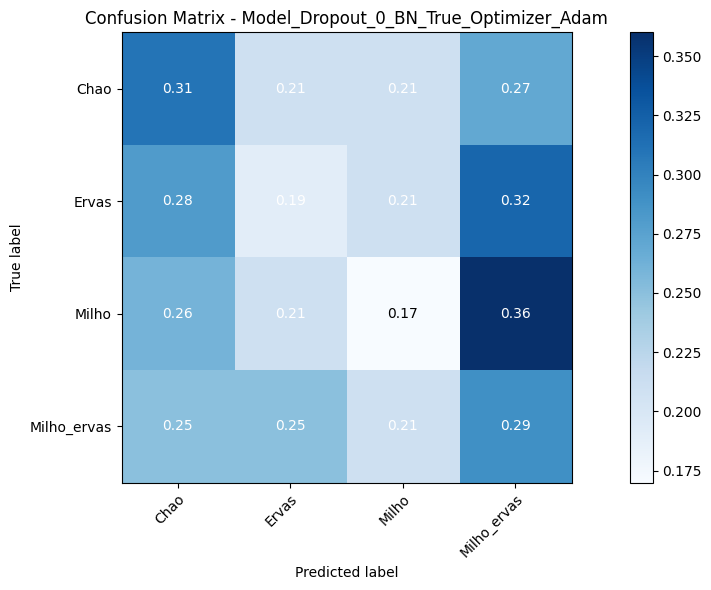

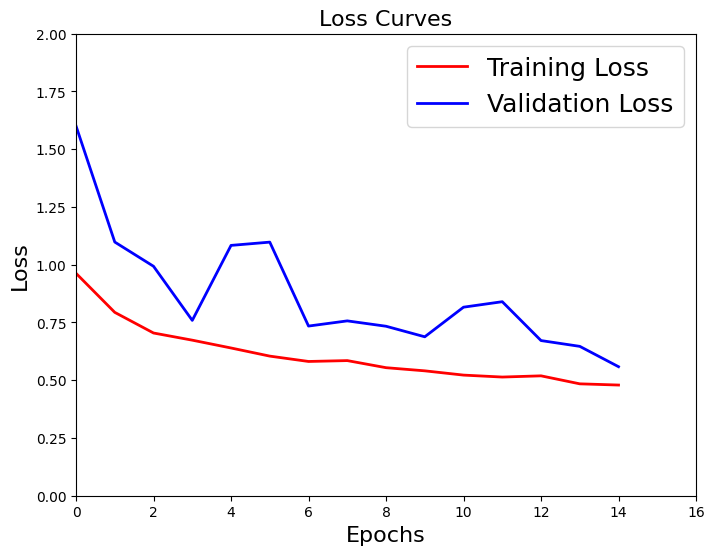

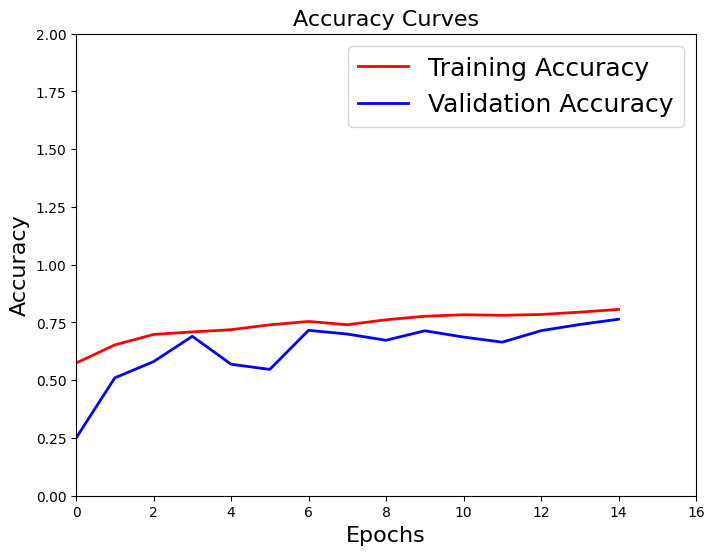

<Figure size 640x480 with 0 Axes>

____________________________________________________________________________________________________

Model: Model_Dropout_0_BN_False_Optimizer_Adam
Model_Dropout_0_BN_False_Optimizer_Adam Accuracy on test set: 0.76


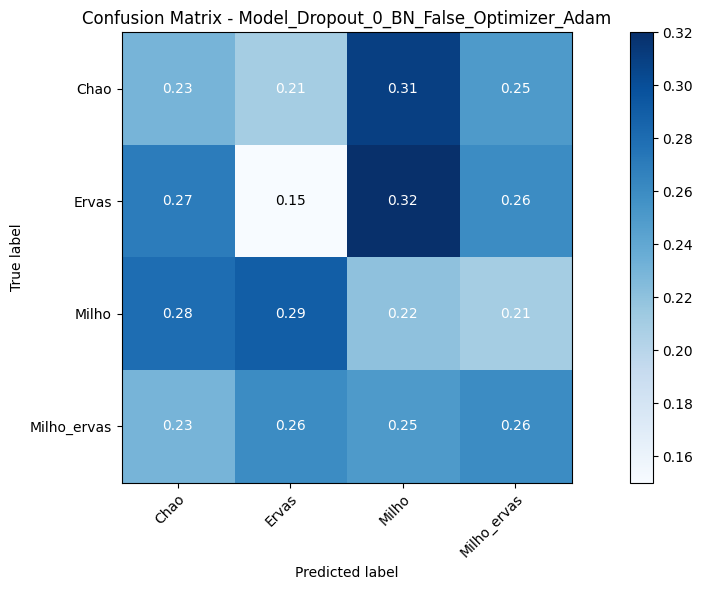

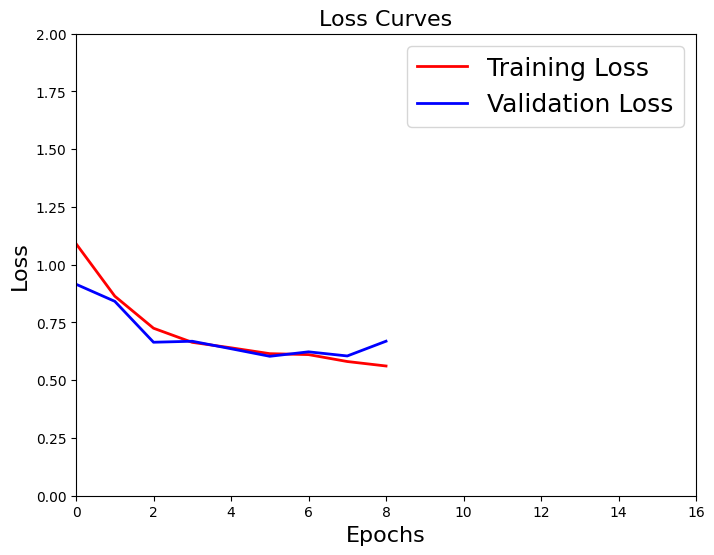

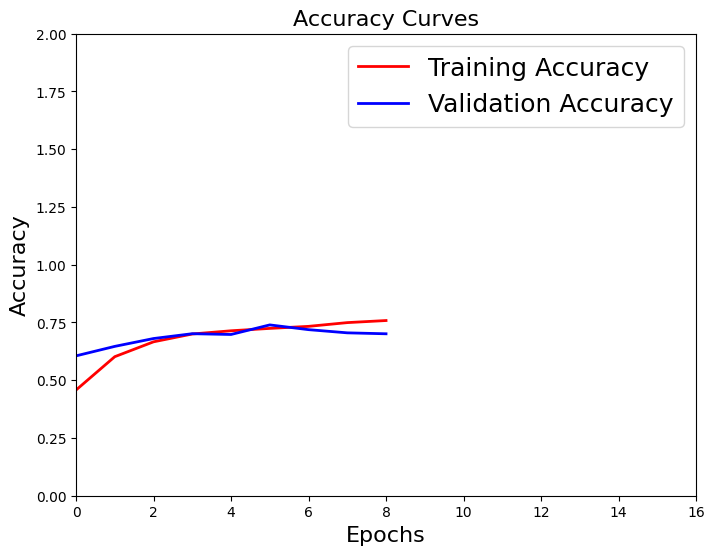

<Figure size 640x480 with 0 Axes>

____________________________________________________________________________________________________

Model: Model_Dropout_0_BN_False_Optimizer_RMSprop
Model_Dropout_0_BN_False_Optimizer_RMSprop Accuracy on test set: 0.79


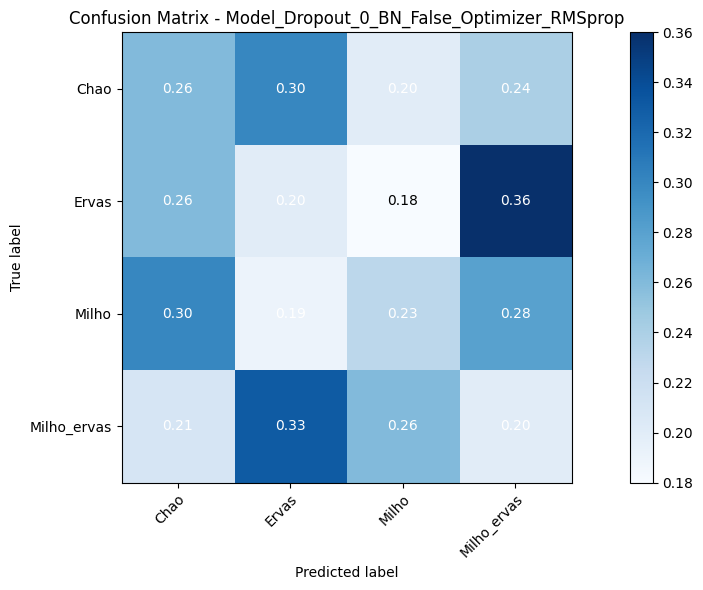

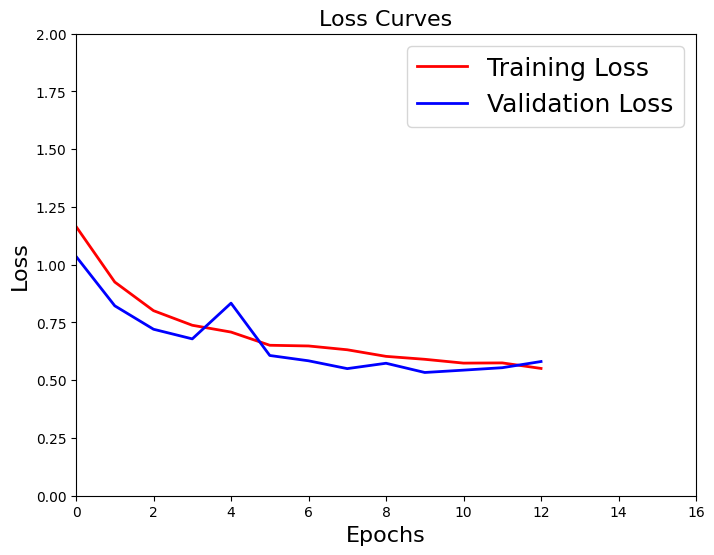

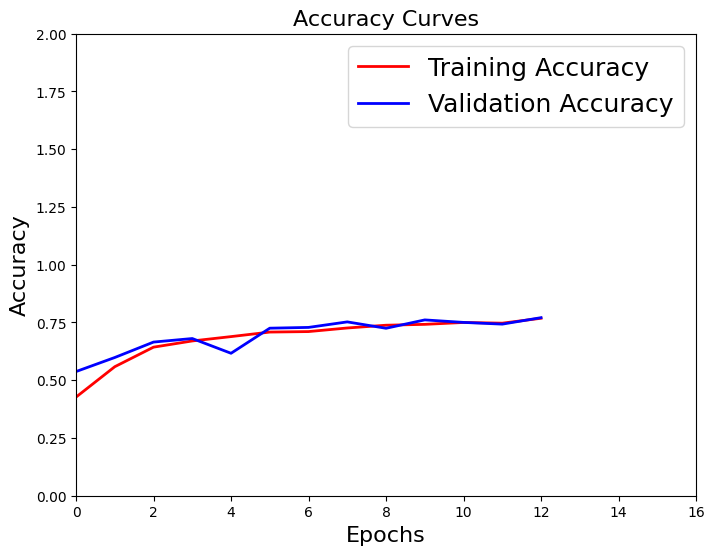

<Figure size 640x480 with 0 Axes>

____________________________________________________________________________________________________

Model: Model_Dropout_0.25_BN_True_Optimizer_Adam
Model_Dropout_0.25_BN_True_Optimizer_Adam Accuracy on test set: 0.73


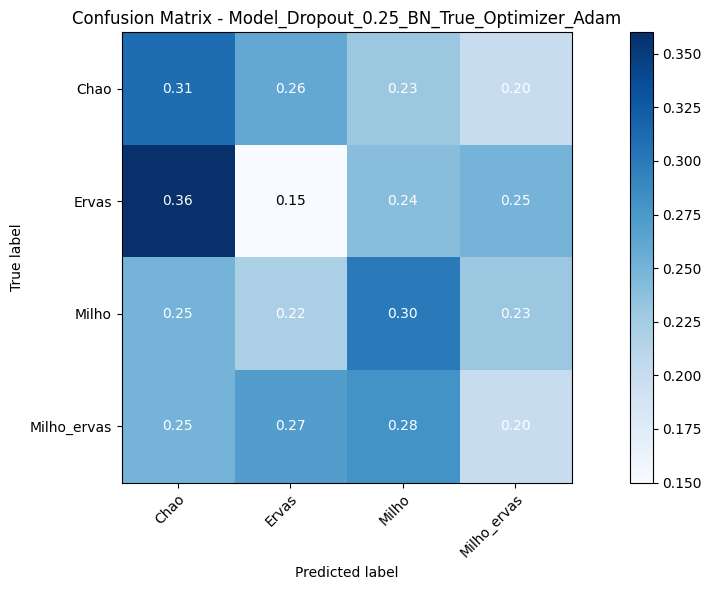

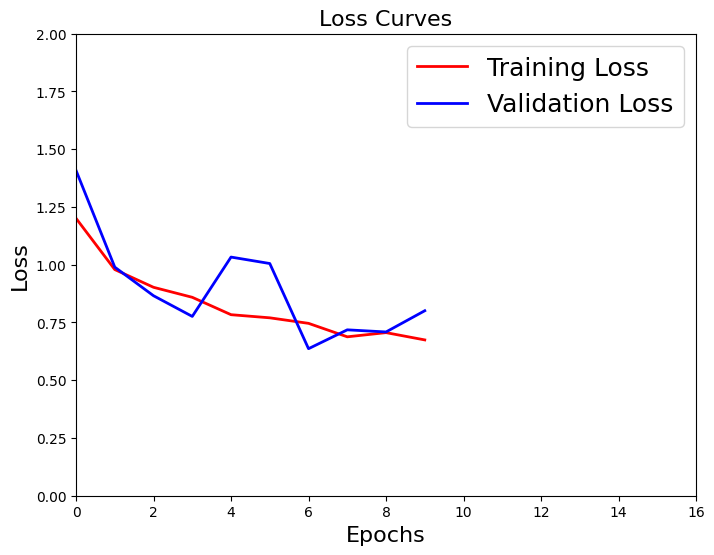

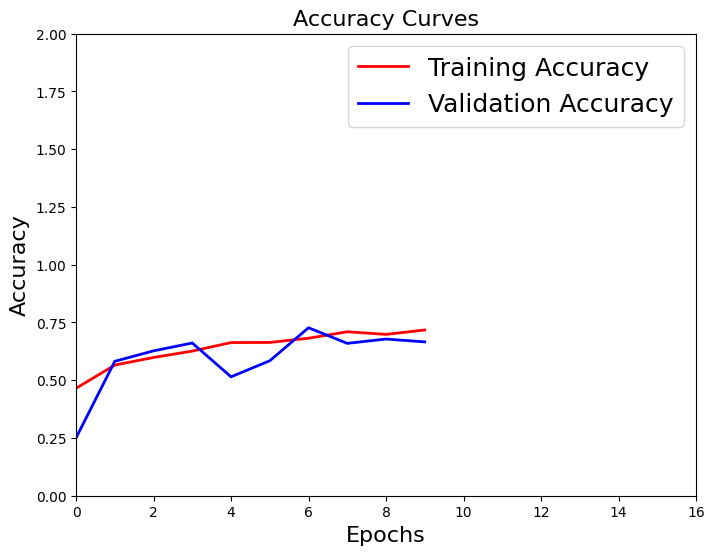

<Figure size 640x480 with 0 Axes>

____________________________________________________________________________________________________

Model: model_standard_xception_imagenet_weights
model_standard_xception_imagenet_weights Accuracy on test set: 0.89


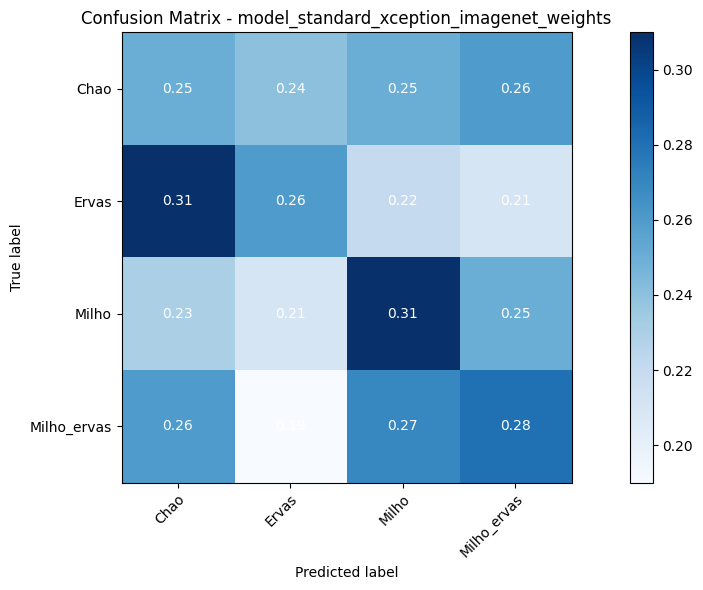

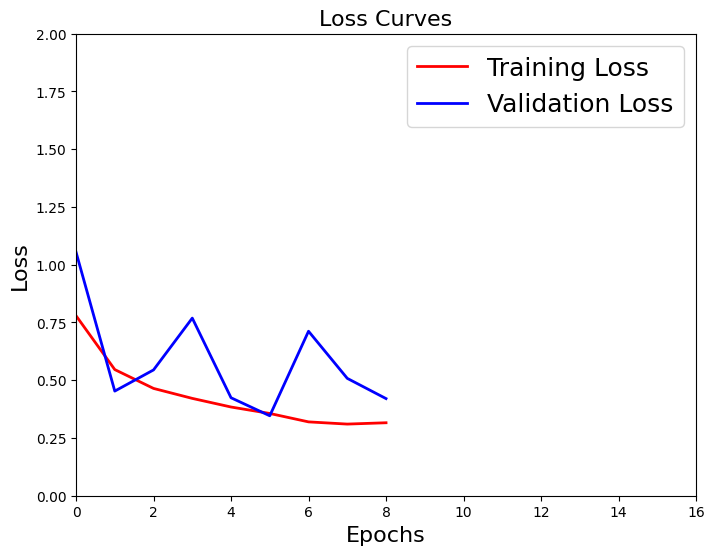

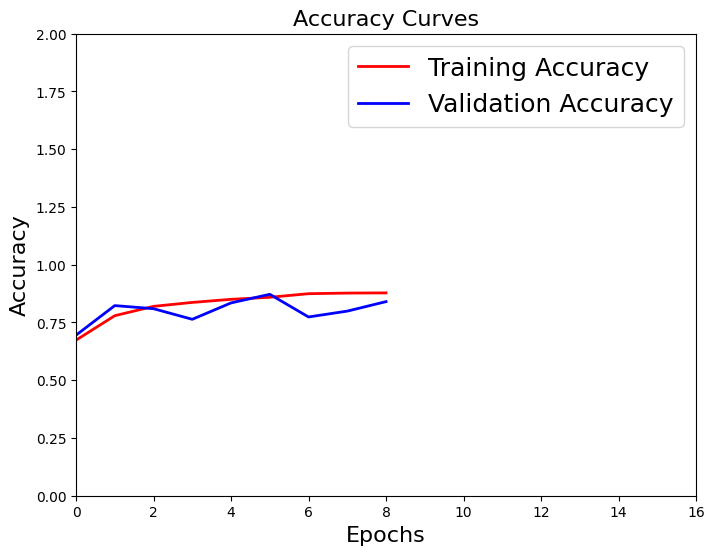

<Figure size 640x480 with 0 Axes>

In [38]:
# Loop through model_results dictionary
for model_name, results in model_results.items():
  if model_name in top_models:
    history = results['history']

    # Extract true and predicted labels from results
    test_true_labels = results['test_true_labels']
    test_pred_labels = results['test_pred_labels']
    test_accuracy = results["test_accuracy"]

    # Print model name and accuracy on test set
    print(50*"__")
    print(f'\nModel: {model_name}')
    print(f'{model_name} Accuracy on test set: {test_accuracy:.2f}')

    plot_confusion_matrix(test_true_labels, test_pred_labels, classes=class_names, normalize=True, title=f'Confusion Matrix - {model_name}')

    plot_loss_curve(history)

    plot_accuracy_curve(history)

    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()  # Show the plot for each model


# Conclusion

We have seen that our base models perform the best when the right parameters are used, excepted for Xception when using the imagenet weights.

There are still some "what ifs" open:
* What if we allow more epochs before early stopping,
* What if we use more data
* What if we use images with a bigger size

  
Also it seems quite difficult for the model to differentiate between ervas, milhos and ervas_milhos.

In the Lime Explanation we will see how the decisions are made.

# LIME Explanation

Here we select some images of the different classes, to display the images and the probability of the class the model detected as most probable and the superpixels using LIME which explains how the model made its choice.
  
**Model used:**  We use the CNN base Model with a Dropout Rate of 0, not using Batch Normalization and the Optimizer RMSprop. This choice was made because it was the best model before we tested the models with the imagenet weights


#### Loading model

In [ ]:
# Load the saved model
best_model = load_model('/content/drive/MyDrive/BIHAR_FINAL_PROJECT/1_IMAGE_CLASSIFICATION/MODELS/Model_Dropout_0_BN_False_Optimizer_RMSprop.h5')

#### Selecting some images
and putting them into a specific directory

In [ ]:
def select_and_copy_images(test_dir, num_images_per_class=5):
    # Create the LIME directory if it doesn't exist
    lime_dir = '/content/LIME'
    os.makedirs(lime_dir, exist_ok=True)

    # Iterate over each subdirectory in the test directory
    for subdir in os.listdir(test_dir):
        subdir_path = os.path.join(test_dir, subdir)
        if os.path.isdir(subdir_path):
            # Create the corresponding directory in the LIME directory
            lime_subdir = os.path.join(lime_dir, subdir)
            os.makedirs(lime_subdir, exist_ok=True)

            # List all files in the subdirectory
            image_files = os.listdir(subdir_path)

            # Shuffle the image files to randomize selection
            random.seed(RANDOM_STATE)
            random.shuffle(image_files)

            # Select and copy five images from the subdirectory
            for i in range(min(num_images_per_class, len(image_files))):
                src = os.path.join(subdir_path, image_files[i])
                dst = os.path.join(lime_subdir, image_files[i])
                shutil.copy(src, dst)


In [ ]:
select_and_copy_images(test_dir)

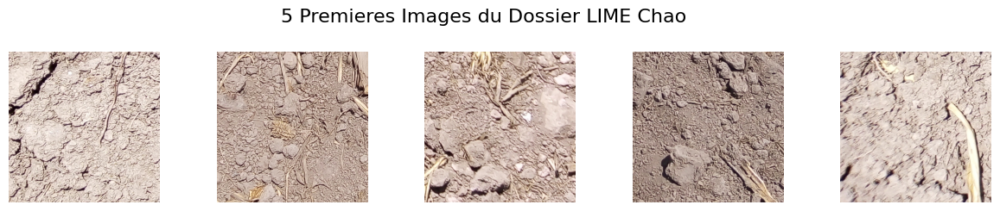

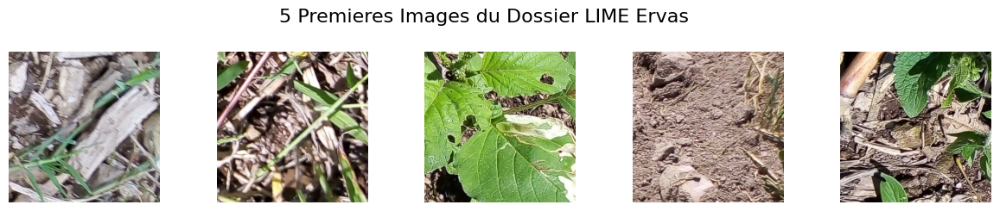

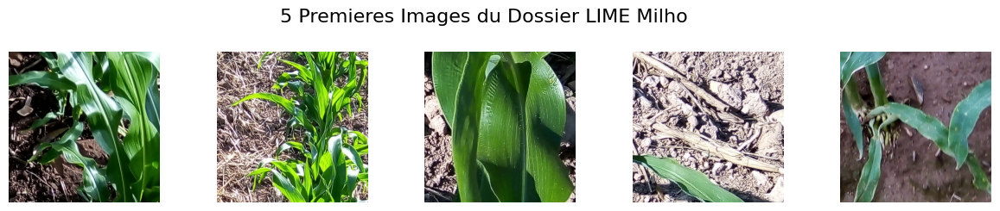

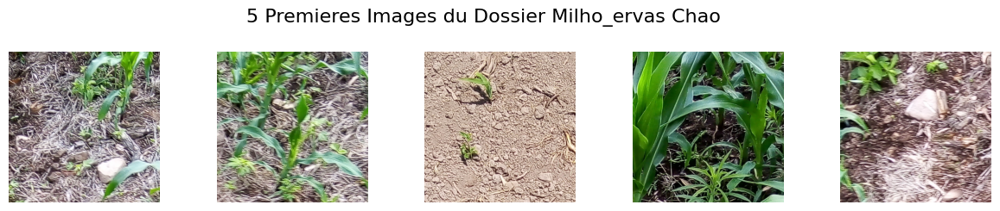

In [ ]:
afficher_images("/content/LIME/Chao", "5 Premieres Images du Dossier LIME Chao", 5)
afficher_images("/content/LIME/Ervas", "5 Premieres Images du Dossier LIME Ervas", 5)
afficher_images("/content/LIME/Milho", "5 Premieres Images du Dossier LIME Milho", 5)
afficher_images("/content/LIME/Milho_ervas", "5 Premieres Images du Dossier Milho_ervas Chao", 5)

### Use model for predictions

  
We do the same preprocessing steps as before. Then we use the LimeImageExplainer and generate the superpixel explanation for the predictions. The predictions are made on the go at explain_instance

In [ ]:
# Preprocessing
lime_dir = '/content/LIME'

lime_test_datagen = ImageDataGenerator(preprocessing_function=normalize_image)

lime_test_generator = test_datagen.flow_from_directory(
    lime_dir,
    target_size=(height, width),
    batch_size=batch_size,
    class_mode='categorical',
    seed=RANDOM_STATE
)

Found 20 images belonging to 4 classes.


In [ ]:
explainer = lime_image.LimeImageExplainer(verbose=False, random_state=RANDOM_STATE)

In [ ]:

def generate_superpixel_explanation(image, model, class_names, true_class_index, num_superpixels=10):

    # Get the explanation
    explanation = explainer.explain_instance(image, model, labels=[0,1,2,3])

    # Get the predicted class probability
    predicted_class_prob = np.max(explanation.local_pred)

    # Get the top label and class name
    top_label = explanation.top_labels[0]
    class_name = class_names[top_label]

    # Generate the explanation image and mask
    temp, mask = explanation.get_image_and_mask(top_label, positive_only=False, num_features=num_superpixels, hide_rest=False)
    temp_true, mask_true = explanation.get_image_and_mask(true_class_index, positive_only=False, num_features=num_superpixels, hide_rest=False)

    # Return the explanation image, true class probability, predicted class probability, top label, and class name
    return mark_boundaries(temp / 2 + 0.5, mask), predicted_class_prob, top_label, class_name, mark_boundaries(temp_true / 2 + 0.5, mask_true)



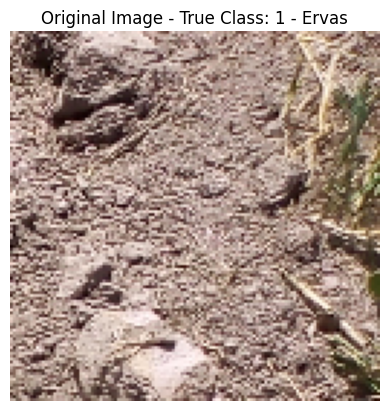

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.7603



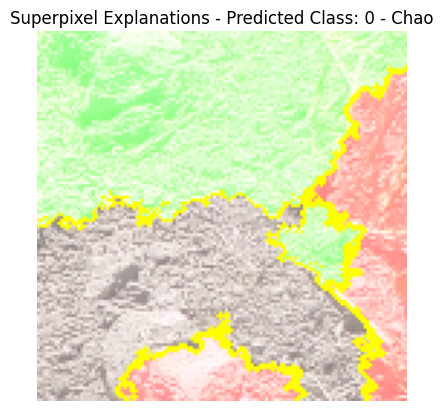

________________________________________________________________________________


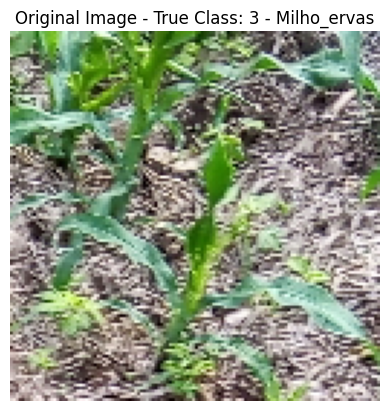

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho_ervas : 0.8875



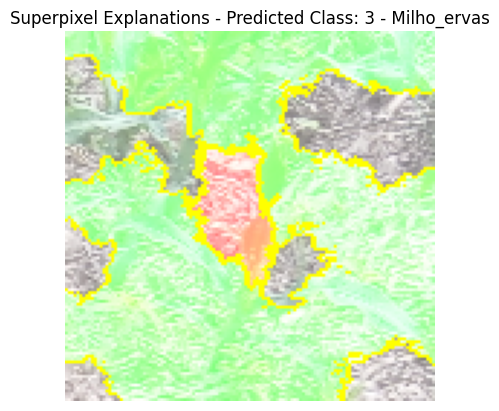

________________________________________________________________________________


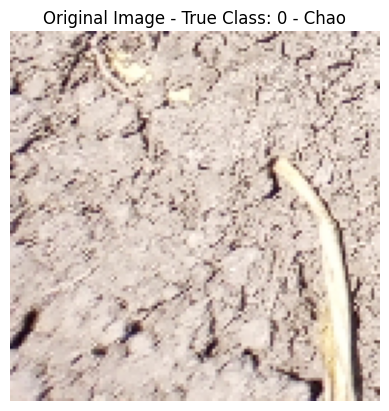

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.9872



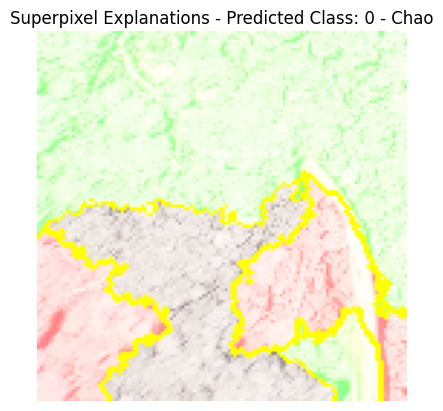

________________________________________________________________________________


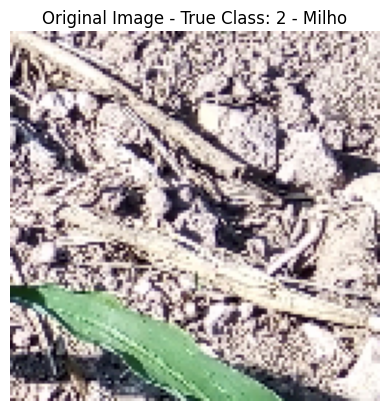

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho : 0.4701



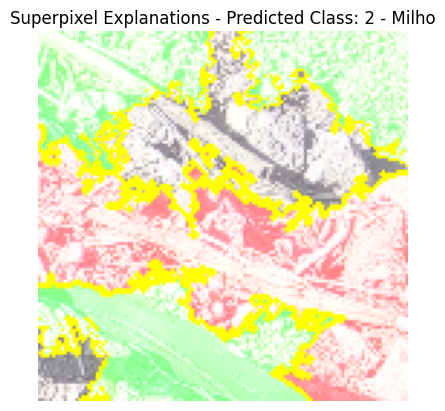

________________________________________________________________________________


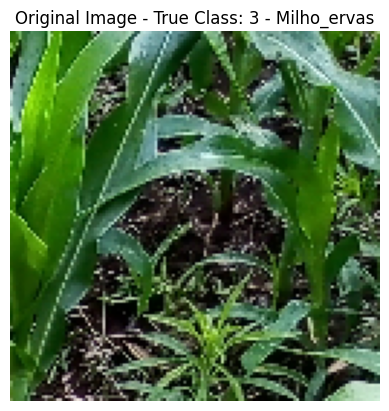

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho_ervas : 0.9382



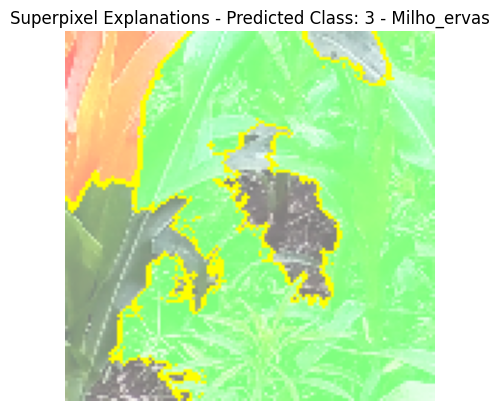

________________________________________________________________________________


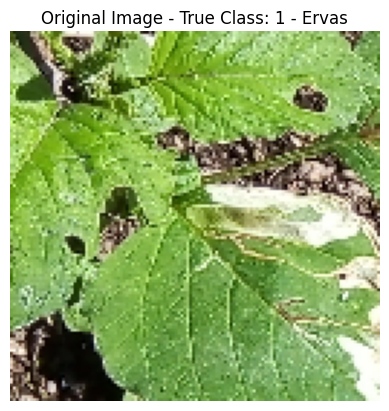

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Ervas : 0.9802



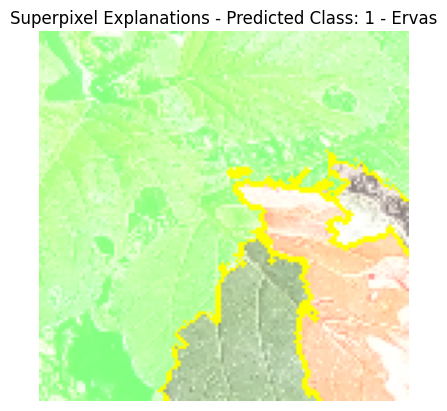

________________________________________________________________________________


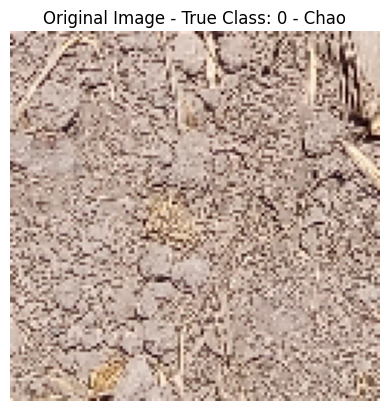

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.9804



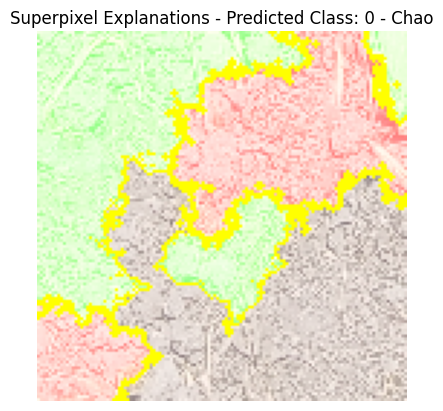

________________________________________________________________________________


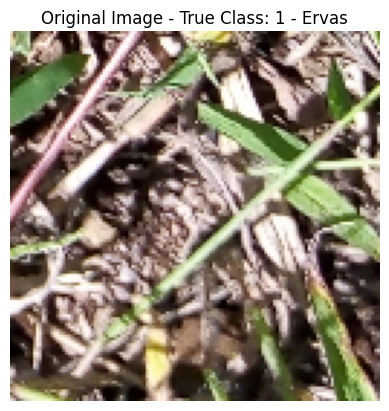

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Ervas : 1.0223



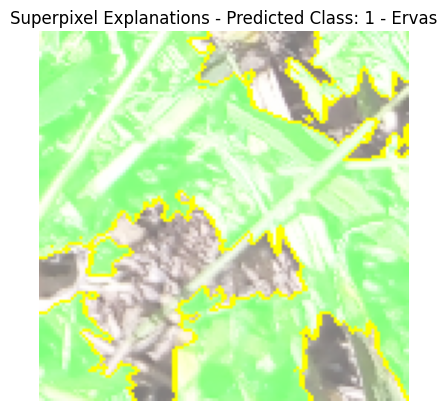

________________________________________________________________________________


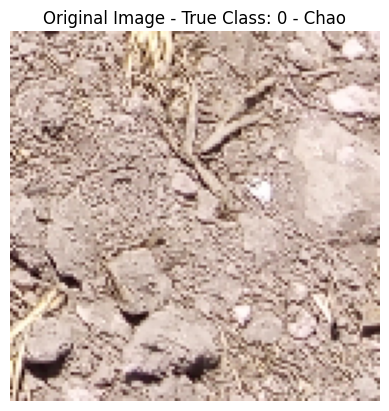

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.9879



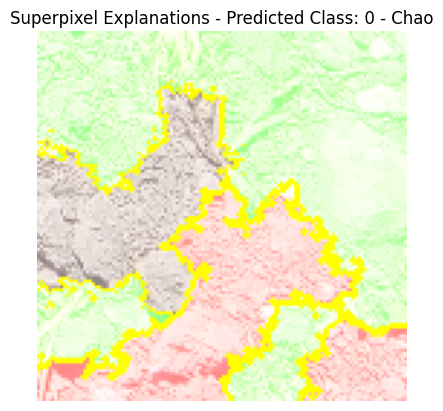

________________________________________________________________________________


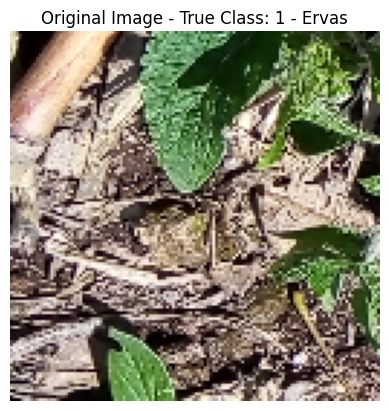

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Ervas : 0.7052



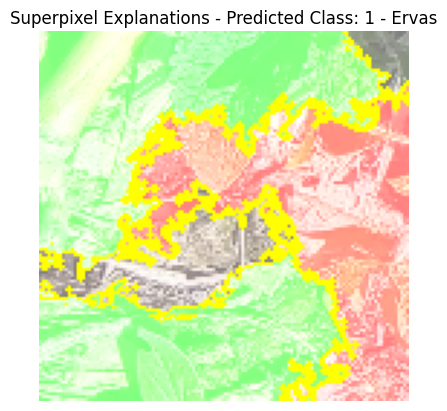

________________________________________________________________________________


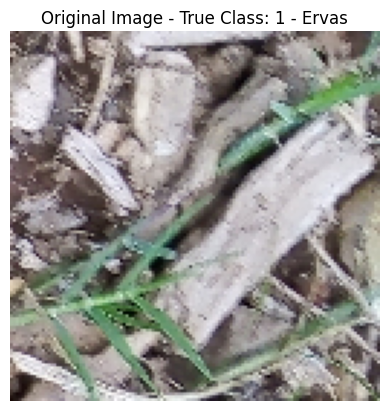

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Ervas : 0.5664



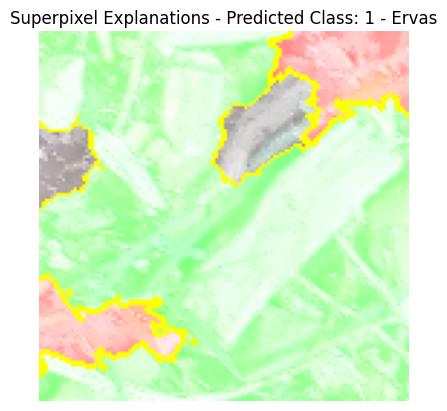

________________________________________________________________________________


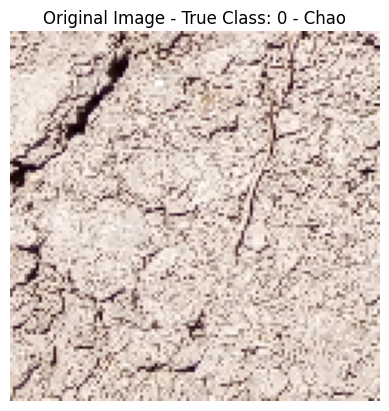

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.9912



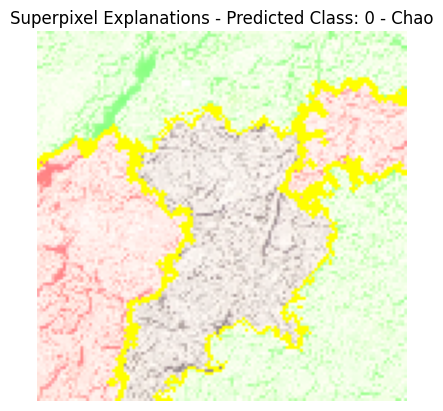

________________________________________________________________________________


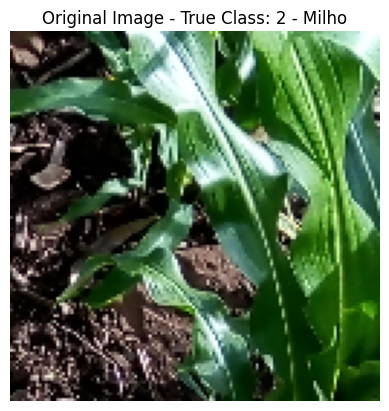

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho_ervas : 0.4734



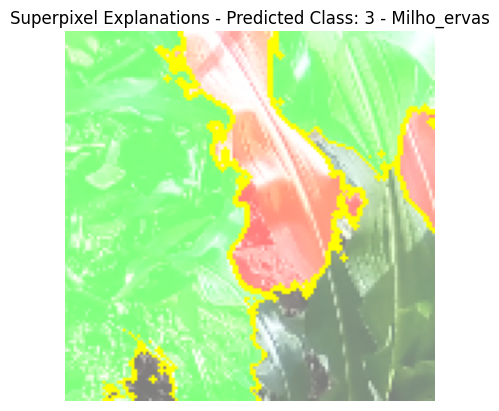

________________________________________________________________________________


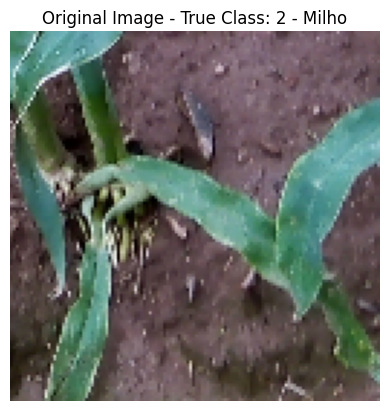

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Ervas : 0.4477



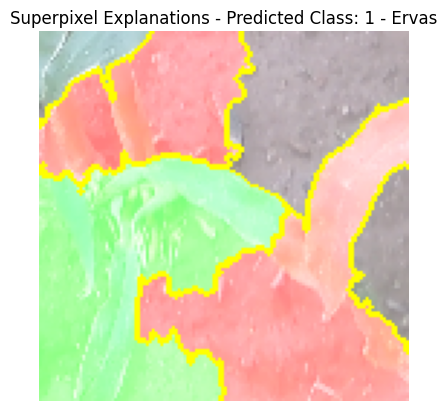

________________________________________________________________________________


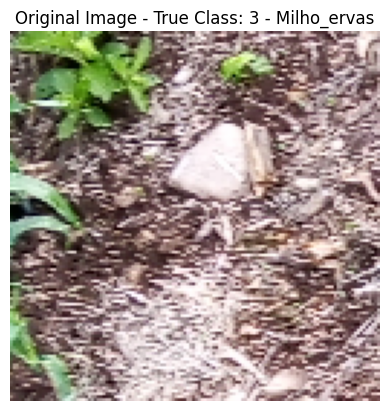

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho_ervas : 0.5057



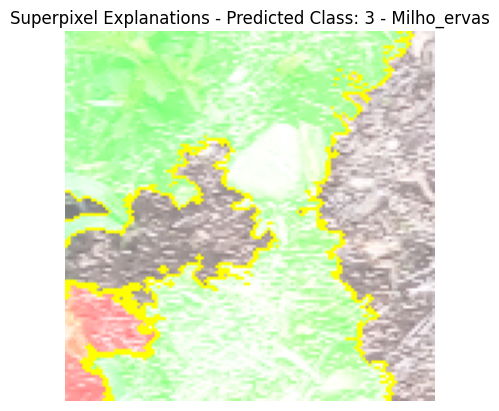

________________________________________________________________________________


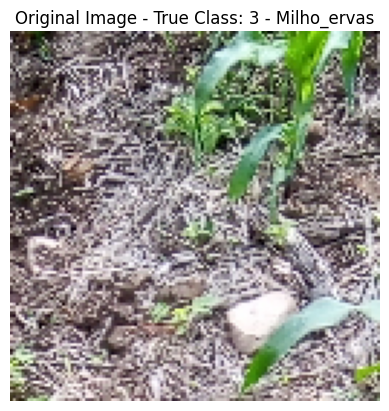

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho_ervas : 0.6272



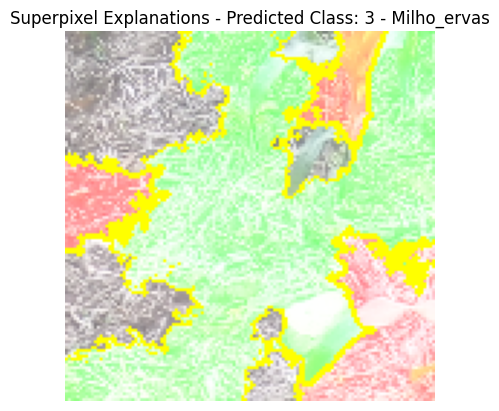

________________________________________________________________________________


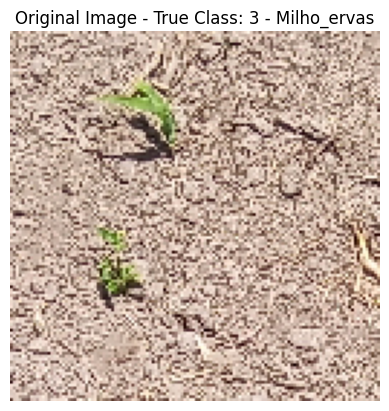

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho : 0.9522



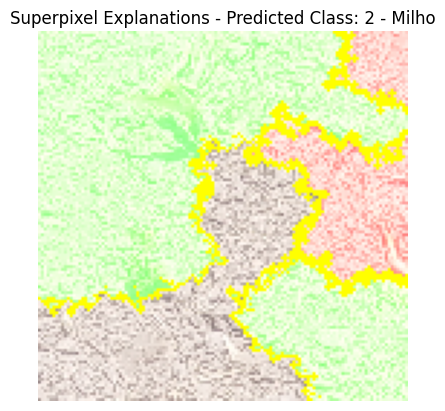

________________________________________________________________________________


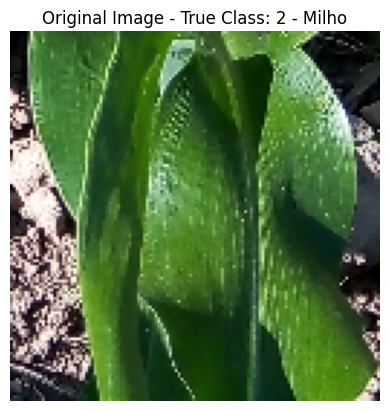

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho : 0.5247



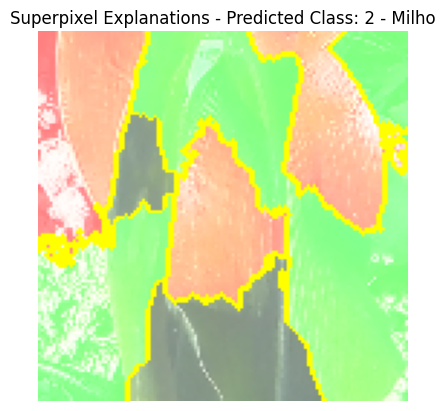

________________________________________________________________________________


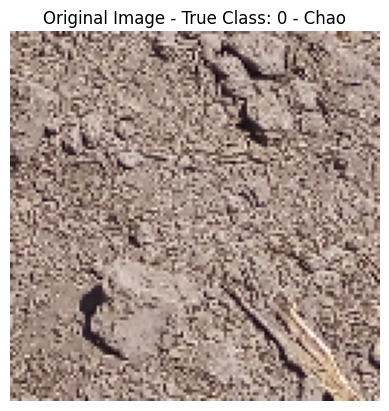

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Chao : 0.9584



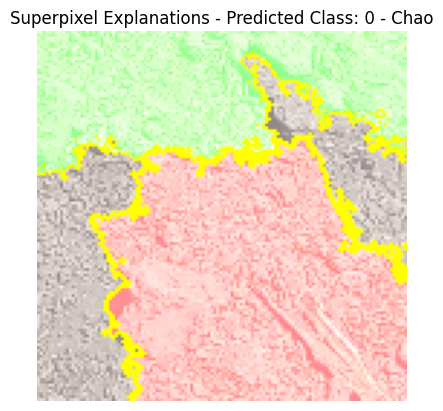

________________________________________________________________________________


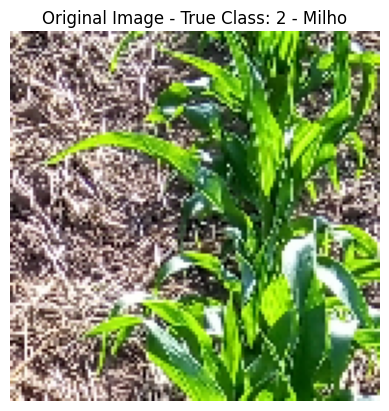

  0%|          | 0/1000 [00:00<?, ?it/s]

Predicted Class: Milho : 0.6185



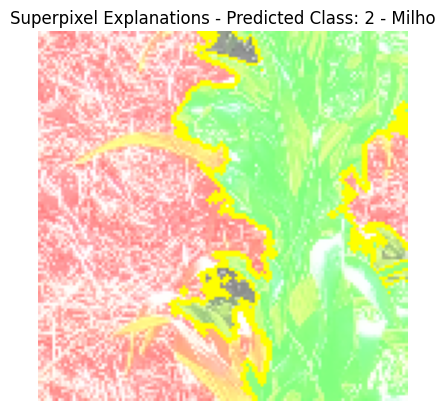

________________________________________________________________________________


In [ ]:
# Iterate over each image and its corresponding prediction
for i in range(20):

    # # Get the true class label of the image
    true_class_index = np.argmax(lime_test_generator[0][1][i])

    # Display the original image
    plt.imshow(lime_test_generator[0][0][i])
    plt.title(f'Original Image - True Class: {true_class_index} - {class_names[true_class_index]}')
    plt.axis('off')
    plt.show()

    # Generate and display superpixel explanations
    explanation_image, predicted_class_prob, top_label, class_name, explanation_image_true = generate_superpixel_explanation(lime_test_generator[0][0][i], best_model, class_names, true_class_index)

    print(f'Predicted Class: {class_names[top_label]} : {predicted_class_prob:.4f}\n')

    plt.imshow(explanation_image)
    plt.title(f'Superpixel Explanations - Predicted Class: {top_label} - {class_name}')
    plt.axis('off')
    plt.show()

    if explanation_image.all() != explanation_image_true.all() :
        plt.imshow(explanation_image_true)
        plt.title(f'Superpixel Explanations - True Class: {true_class_index} - {class_names[true_class_index]}')
        plt.axis('off')
        plt.show()


    print(40*"__")